In [11]:
import sys
import os
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sys.path.append(os.path.abspath("../scripts"))

In [12]:
from data_loader import load_clean_data
from metrics import get_sentiment_proportions, compute_sentiment_ratios
from metrics import compute_ratios_comfort
from visualization import (
    plot_percentages, plot_stacked_bar_chart, plot_comfort, plot_exposure, plot_income, 
    plot_stacked_bar_chart_interaction
)
from sentiment_utils import (
    compute_sentiment_metrics, interpret_metrics, plot_sentiment_trend
)

In [13]:
data_path = "../data/muslim_brand_july_2026.csv"
july26 = load_clean_data(data_path)

In [14]:
july26.head()

,Start Date,End Date,What is your religion?,Religion_other,How many Muslim people have you talked to in the last 7 days?,How do you feel about Muslim people in America?,What is your level of education?,Where do you get your news from?,News_other,How comfortable do you feel interacting with Muslims in your community?,...,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?","How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",Do you feel you have a lot in common with Muslims in America?,"If you had questions about Islam or Muslims, where would you go to learn more?",Have you ever changed your opinion about a group of people after getting to know someone personally,Have you ever been helped by a Muslim?,Gender,Age,Major US Region,Household Income
0,07/17/2026 09:16:28 PM,07/17/2026 09:18:09 PM,Christian (Catholic),NaN,2 to 4,Good,Graduate school,Twitter,NaN,Very comfortable,...,No,A great deal,Yes,Religious Leaders,Yes,Yes,male,45_to_60,pacific,150000_to_174999
1,07/17/2026 07:09:37 PM,07/17/2026 07:10:20 PM,Christian (Catholic),NaN,2 to 4,Good,College,Twitter,NaN,Comfortable,...,Yes,A moderate amount,Yes,Media,Yes,Yes,male,45_to_60,pacific,50000_to_74999
2,07/17/2026 07:00:33 PM,07/17/2026 07:03:15 PM,Christian (Catholic),NaN,2 to 4,Good,Some College,Google News,NaN,Comfortable,...,Yes,A moderate amount,Yes,Friends,Yes,Yes,male,60_above,pacific,25000_to_49999
3,07/17/2026 06:53:15 PM,07/17/2026 06:55:47 PM,Christian (Other),NaN,None - 0,Good,College,NPR,NaN,Comfortable,...,No,A little,Not sure,Internet,Yes,No,male,60_above,west_south_central,100000_to_124999
4,07/17/2026 06:35:11 PM,07/17/2026 06:37:04 PM,Christian (Other),NaN,None - 0,Good,Some College,NPR,NaN,Very comfortable,...,No,A little,Not sure,Internet,Yes,No,male,45_to_60,south_atlantic,100000_to_124999


In [17]:
july26.shape

(129, 23)

In [18]:
july26.columns

Index(['Start Date', 'End Date', 'What is your religion?', 'Religion_other',
       'How many Muslim people have you talked to in the last 7 days?',
       'How do you feel about Muslim people in America?',
       'What is your level of education?', 'Where do you get your news from?',
       'News_other',
       'How comfortable do you feel interacting with Muslims in your community?',
       'How often do you hear positive things about Muslims in the media?',
       'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?',
       'Would you feel comfortable buying goods or services from a Muslim-owned business?',
       'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?',
       'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?',
       'Do you feel you have a lot in common with Muslims in America?',
       'If you had questions about Isla

# Categories

1. Religion
2. Education
3. Levels of Exposure
4. Levels of Comfort
5. News Source
6. Income Level
7. Gender
8. Age
9. Major US Region


# Questions

1. 'How do you feel about Muslim people in America?'
2. 'How comfortable do you feel interacting with Muslims in your community?'
3. 'How often do you hear positive things about Muslims in the media?'
4.   'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?'
5. 'Would you feel comfortable buying goods or services from a Muslim-owned business?'
6. 'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?'
7. 'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?'
8. 'Do you feel you have a lot in common with Muslims in America?'
9. 'If you had questions about Islam or Muslims, where would you go to learn more?',
10. 'Have you ever changed your opinion about a group of people after getting to know someone personally'
11. 'Have you ever been helped by a Muslim?'

# Current State of Muslims In the United States (April 2026 - July 2026)

Here is a collection of articles circulating in the media during this time-frame. This could be a useful resource as we try and understand world events shaping these responses.

1. ICE detention of Wisconsin Muslim leader

One of the most significant stories during this period involved Salah Sarsour, president of Wisconsin's largest mosque. After spending more than 80 days in ICE detention, a federal judge found his detention was likely retaliatory because of his pro-Palestinian advocacy. The case became a major civil rights issue, raising concerns about immigration enforcement, freedom of speech, and due process for Muslim community leaders.

Source:
https://www.theguardian.com/us-news/2026/jul/21/muslim-leader-ice-detention-wisconsin

2. National Muslim Advocacy Day

Hundreds of American Muslims traveled to Washington, D.C., to meet with members of Congress during National Muslim Advocacy Day. Discussions focused on religious freedom, civil rights, immigration policy, education, healthcare, and U.S. foreign policy, highlighting continued political engagement by Muslim Americans.

Source:
https://www.instagram.com/reel/DWoe9awjj-k/

3. American Muslim Appreciation and Awareness Month

In April 2026, the San Diego County Board of Education proclaimed April as American Muslim Appreciation and Awareness Month. The resolution recognized the contributions of Muslim Americans and encouraged greater understanding of Islam and Muslim communities through education.

Source:
https://www.sdcoe.net/about-sdcoe/news/post/board-resolution-proclaims-april-2026-as-american-muslim-appreciation-and-awareness-month

4. Continued concerns about Islamophobia

Researchers and civil rights organizations continued documenting anti-Muslim incidents and rhetoric throughout the spring and summer. Community leaders expressed ongoing concerns about discrimination, mosque security, and public attitudes toward Muslims amid continued tensions related to events in the Middle East.

Source:
https://bridge.georgetown.edu/today_islamophobia/june-8-2026/

5. Federal engagement on Muslim community security

National Shia Muslim organizations met with members of Congress and homeland security officials to discuss threats against mosques and Muslim institutions. The meetings focused on improving coordination with federal agencies to enhance the safety and security of Muslim communities.

Source:
https://en.wikipedia.org/wiki/Shia_Muslim_Foundation

6. Impact of Middle East conflicts on American Muslims

Escalating conflicts involving the United States, Iran, Israel, and Gaza continued to shape public discussion within American Muslim communities. These events influenced advocacy efforts, demonstrations, charitable initiatives, and concerns about rising anti-Muslim sentiment across the United States.

Source:
https://apnews.com/article/c492604ca2bf139c6d7db7065c951ff1

# Compute Key Metrics

In [20]:
# Sentiment proportions
sentiment_prop = get_sentiment_proportions(july26, 'How do you feel about Muslim people in America?')
display(sentiment_prop)

# Ratios
pos_neg_ratio, pos_neutral_ratio = compute_sentiment_ratios(july26, \
                                                            'How do you feel about Muslim people in America?')
net_sentiment_july_26 = sentiment_prop.iloc[0,1]-sentiment_prop.iloc[2,1] # good minus bad
net_sentiment_apr_26= 50.4

print(f"Positive to Negative Ratio: {pos_neg_ratio:.2f}")
print(f"Positive to Neutral Ratio: {pos_neutral_ratio:.2f}")
print(f"Net Sentiment Score (July 2026): {net_sentiment_july_26:.2f}")
print(f"Quartely change in net sentiment score:{net_sentiment_july_26 - net_sentiment_apr_26}")


,Category,Percentage
0,Good,56.589147
1,Neutral,38.759690
2,Bad,4.651163


Positive to Negative Ratio: 12.17
Positive to Neutral Ratio: 1.46
Net Sentiment Score (July 2026): 51.94
Quartely change in net sentiment score:1.5379844961240323


# Comfort Metric

In [21]:
question = 'How comfortable do you feel interacting with Muslims in your community?'
comfort_level = get_sentiment_proportions(july26, question)

In [23]:
comfort_level

,Category,Percentage
0,Very comfortable,44.961240
1,Comfortable,31.782946
2,Neutral,20.155039
3,Uncomfortable,3.100775


In [24]:
ratios = compute_ratios_comfort(comfort_level)

In [25]:
ratios

Very comfortable / Neutral           2.230769
Comfortable / Neutral                1.576923
Very comfortable / Uncomfortable    14.500000
Comfortable / Uncomfortable         10.250000
Name: Ratio, dtype: float64

# Visualizations

# Overall Public Opinion

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Public_Opinion_on_Muslims_July_2026.png


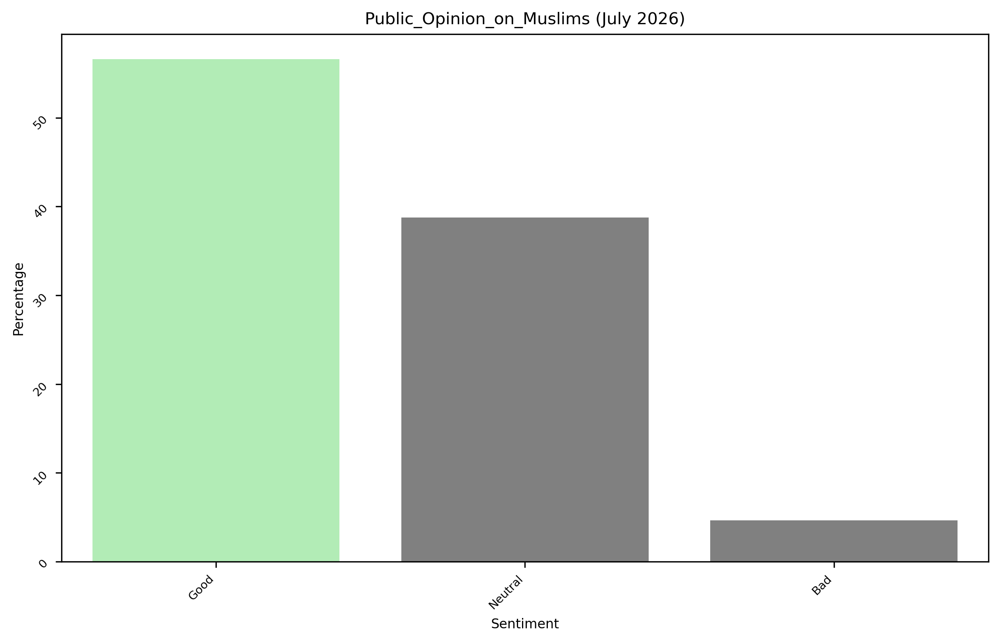

In [26]:
plot_percentages(july26,
                 column_name='How do you feel about Muslim people in America?',
                 x_label='Sentiment',
                 title='Public_Opinion_on_Muslims (July 2026)')

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Comfort_levels_Around_Muslims_in_America_July_2026.png


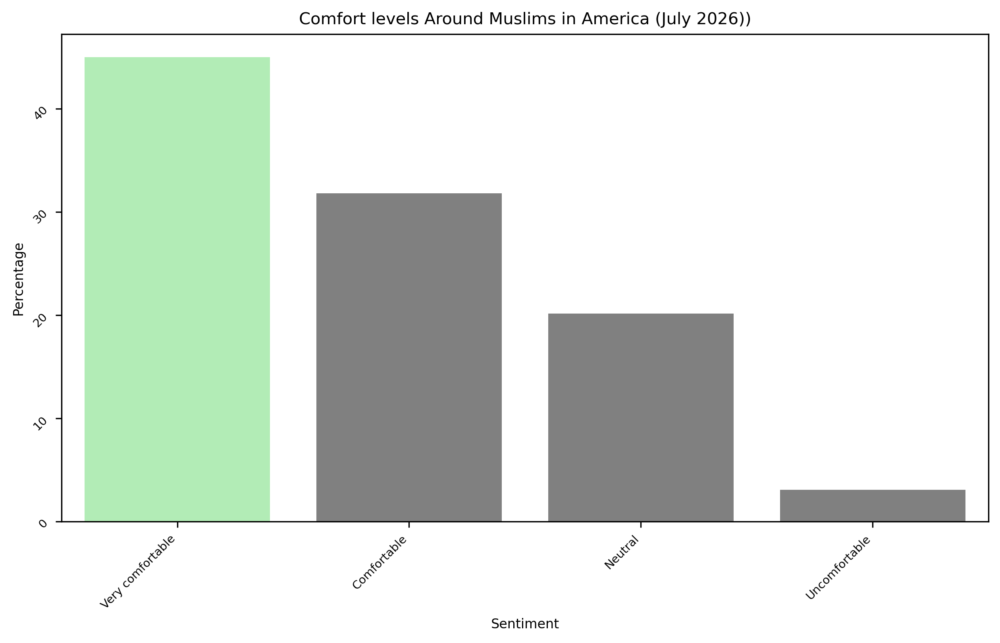

In [27]:
plot_percentages(july26,
                 column_name='How comfortable do you feel interacting with Muslims in your community?',
                 x_label='Sentiment',
                 title='Comfort levels Around Muslims in America (July 2026))')

# Religion Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Distribution_of_Religion_July_2026.png


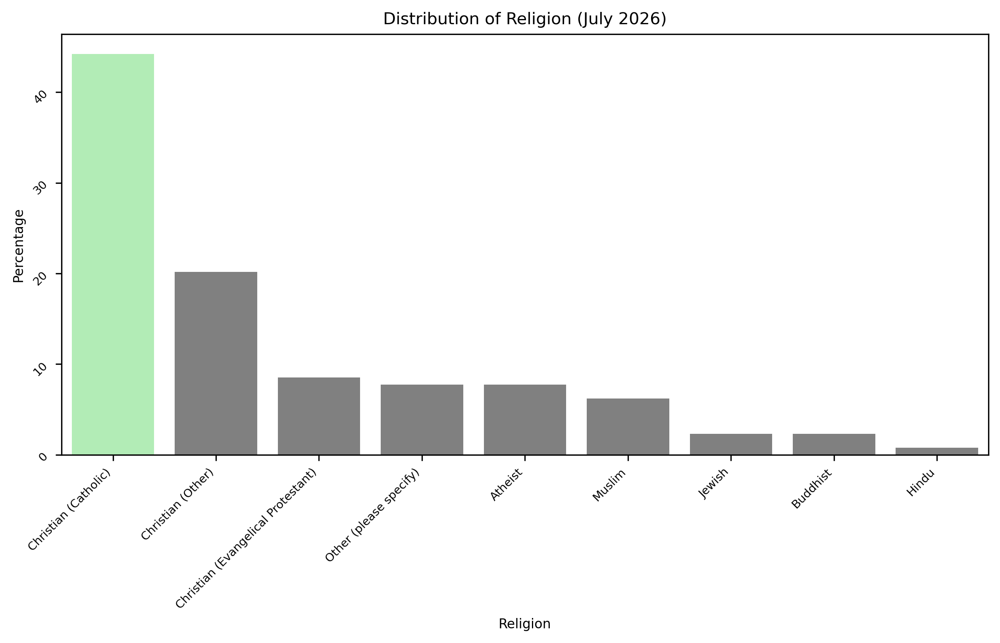

In [28]:
plot_percentages(july26,
                 column_name='What is your religion?',
                 x_label='Religion',
                 title='Distribution of Religion (July 2026)')

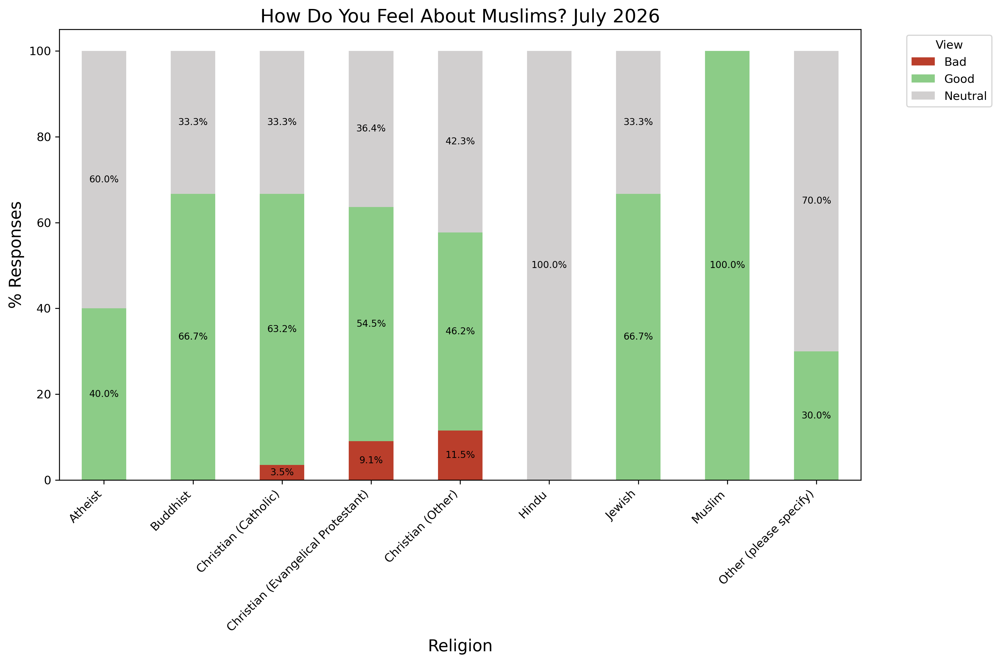

In [29]:
plot_stacked_bar_chart(july26,
                       title='How Do You Feel About Muslims? July 2026',
                       xlabel='Religion',
                       ylabel='% Responses',
                       cat_col='What is your religion?',
                       sent_col='How do you feel about Muslim people in America?')

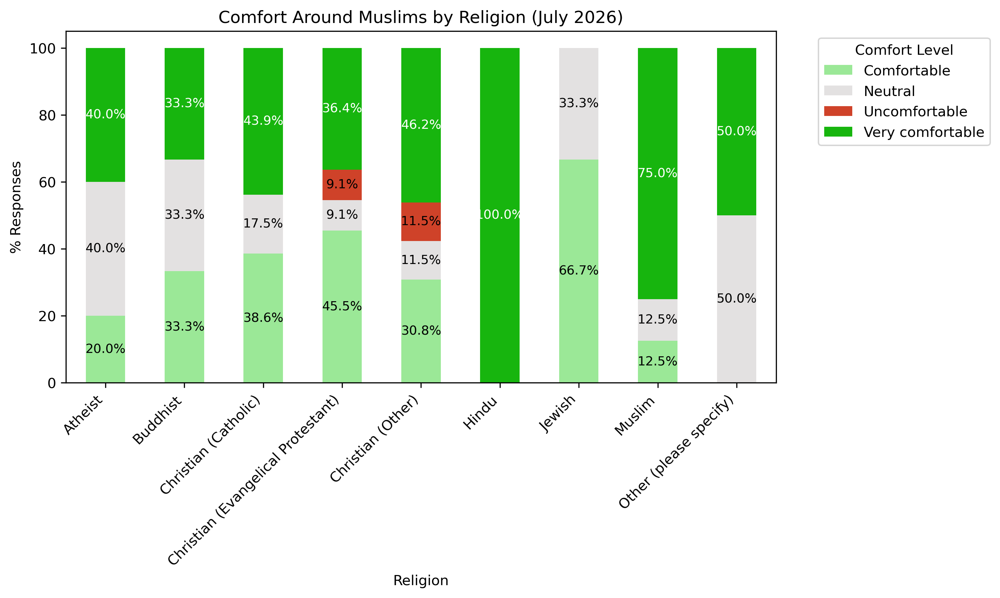

In [30]:
plot_comfort(july26,
             category_col='What is your religion?',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Religion (July 2026)',
             xlabel='Religion',
             ylabel='% Responses')

# Gender Vs. Sentiment

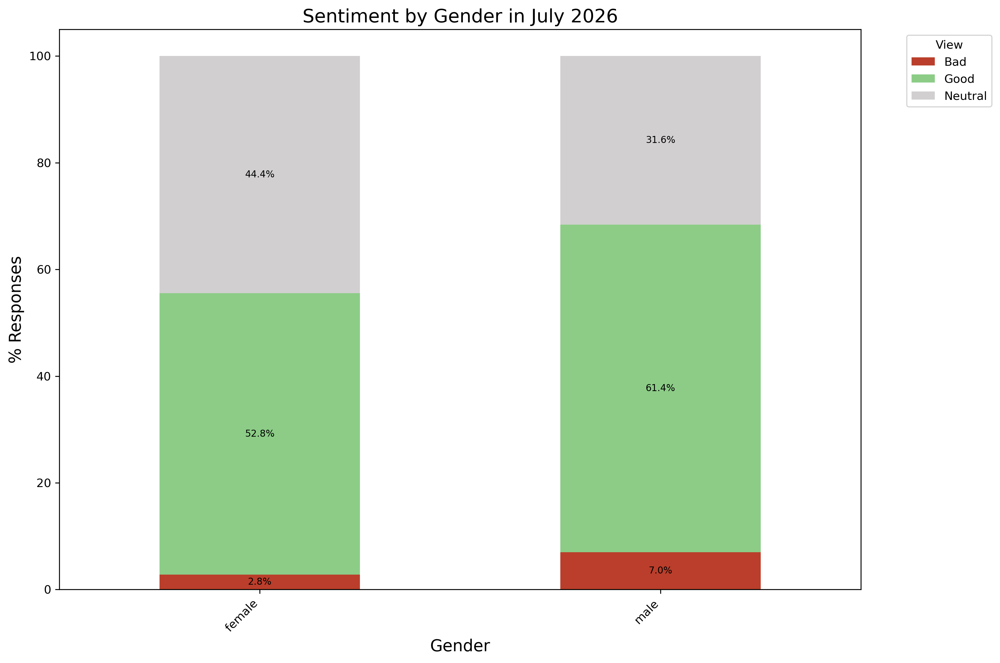

In [31]:
plot_stacked_bar_chart(july26,
                       title='Sentiment by Gender in July 2026',
                       xlabel='Gender',
                       ylabel='% Responses',
                       cat_col='Gender',
                       sent_col='How do you feel about Muslim people in America?')

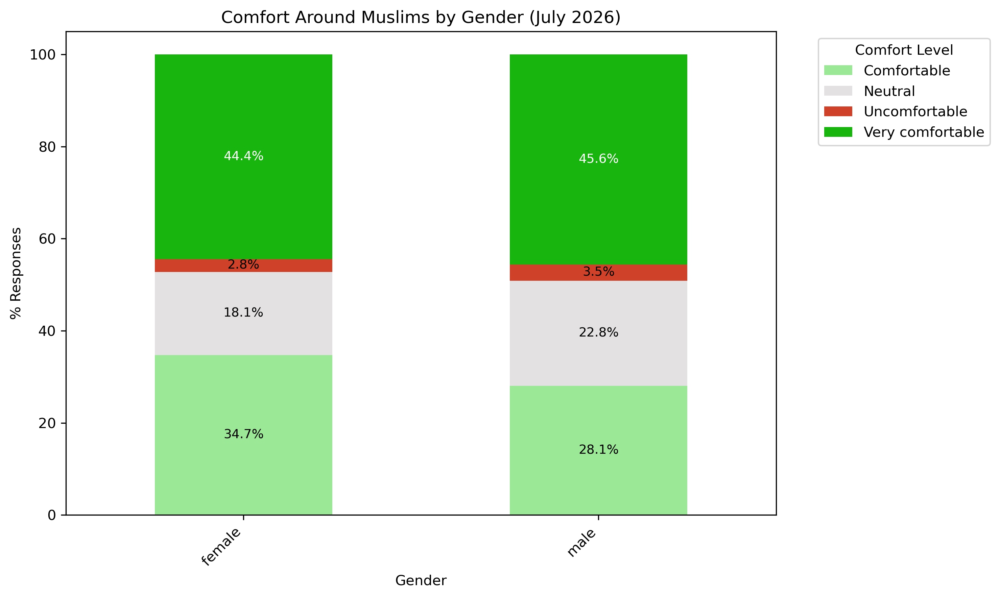

In [33]:
plot_comfort(july26,
             category_col= 'Gender',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Gender (July 2026)',
             xlabel='Gender',
             ylabel='% Responses')

# Education Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/The_Majority_of_Those_Surveyed_Hold_Degrees_In_Higher_Education_July_2026.png


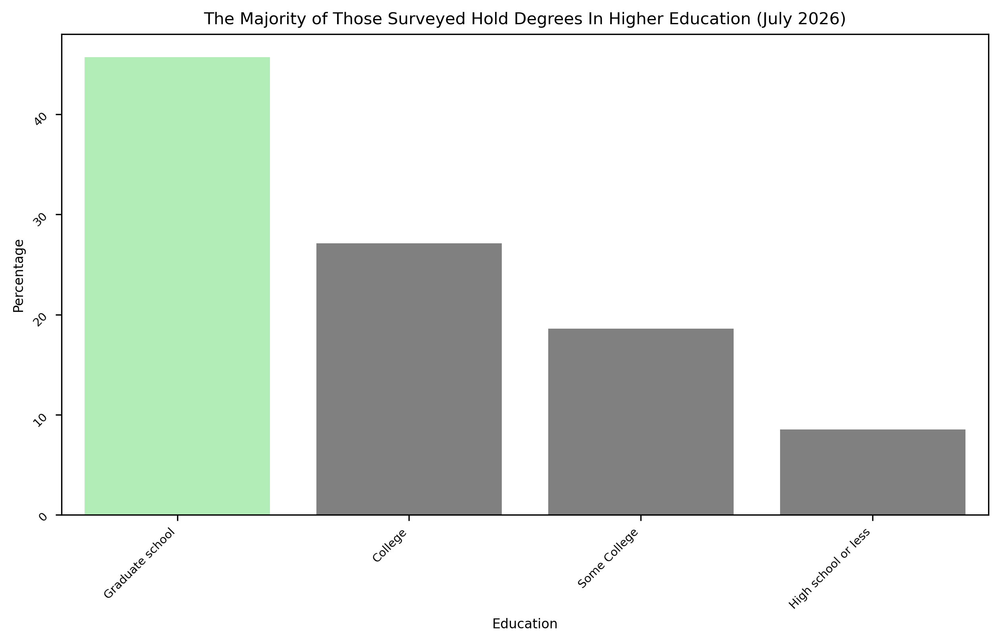

In [34]:
plot_percentages(july26,'What is your level of education?', 'Education',
           'The Majority of Those Surveyed Hold Degrees In Higher Education (July 2026)')

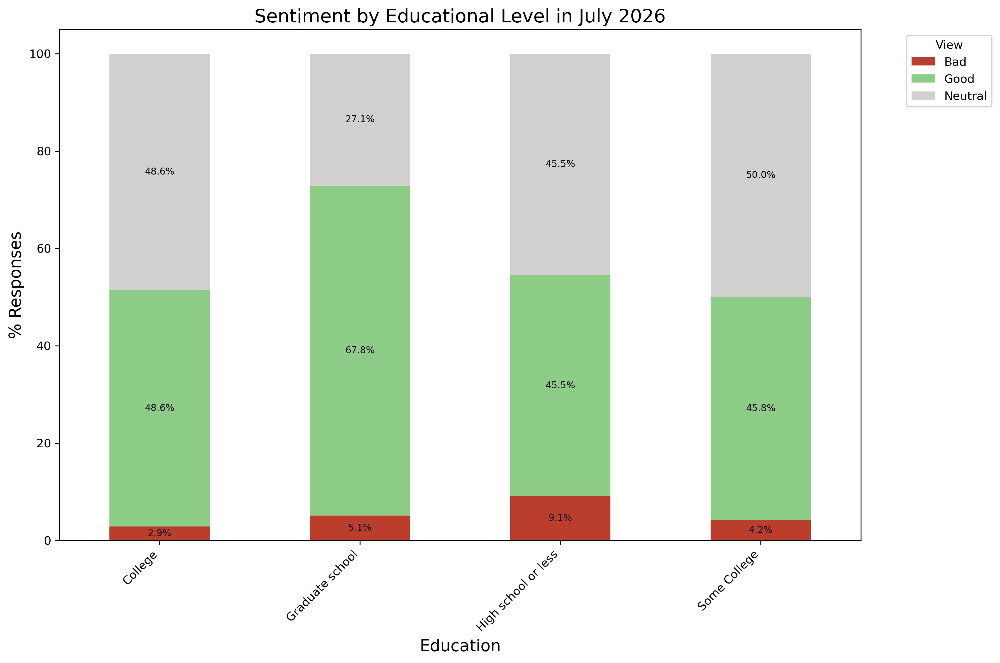

In [35]:
plot_stacked_bar_chart(july26,
                       title='Sentiment by Educational Level in July 2026',
                       xlabel='Education',
                       ylabel='% Responses',
                       cat_col='What is your level of education?',
                       sent_col='How do you feel about Muslim people in America?')

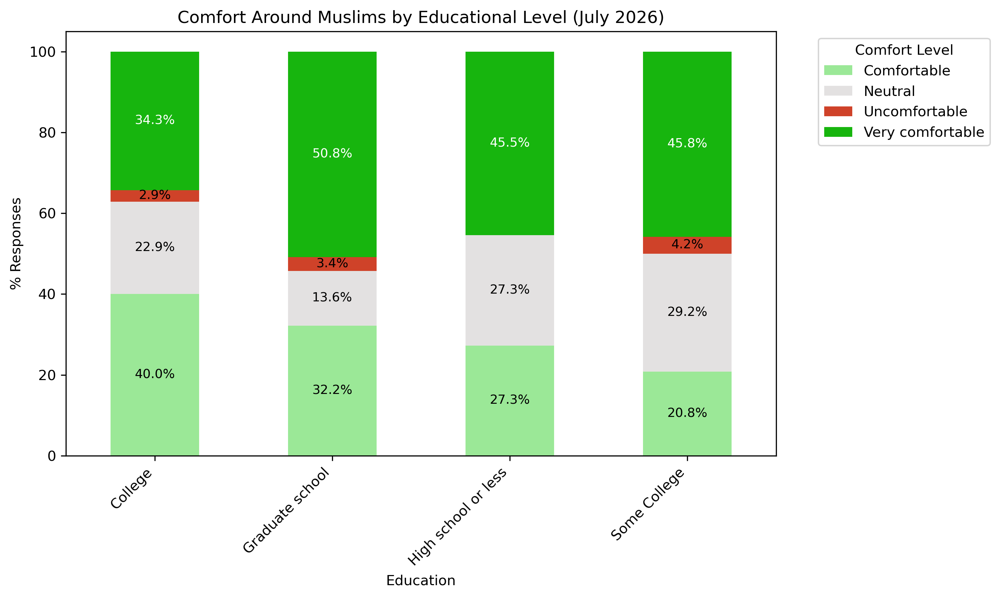

In [36]:
plot_comfort(july26,
             category_col= 'What is your level of education?',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Educational Level (July 2026)',
             xlabel='Education',
             ylabel='% Responses')

# Age Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Around_45%_Of_Survey_Partipants_are_aged_30-44July_2026.png


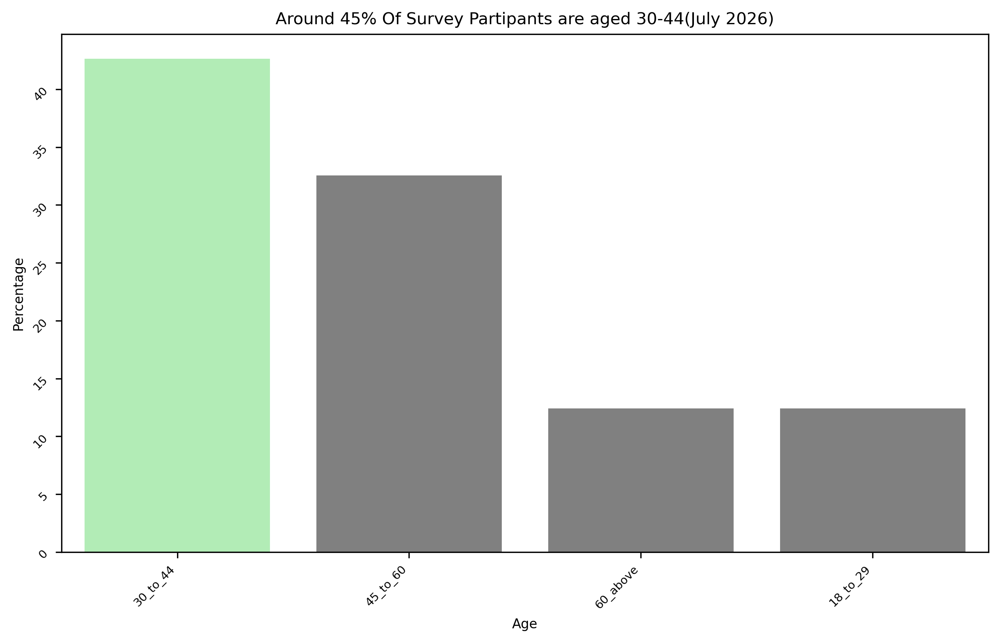

In [39]:
plot_percentages(july26,'Age', 'Age',
           'Around 45% Of Survey Partipants are aged 30-44(July 2026)')

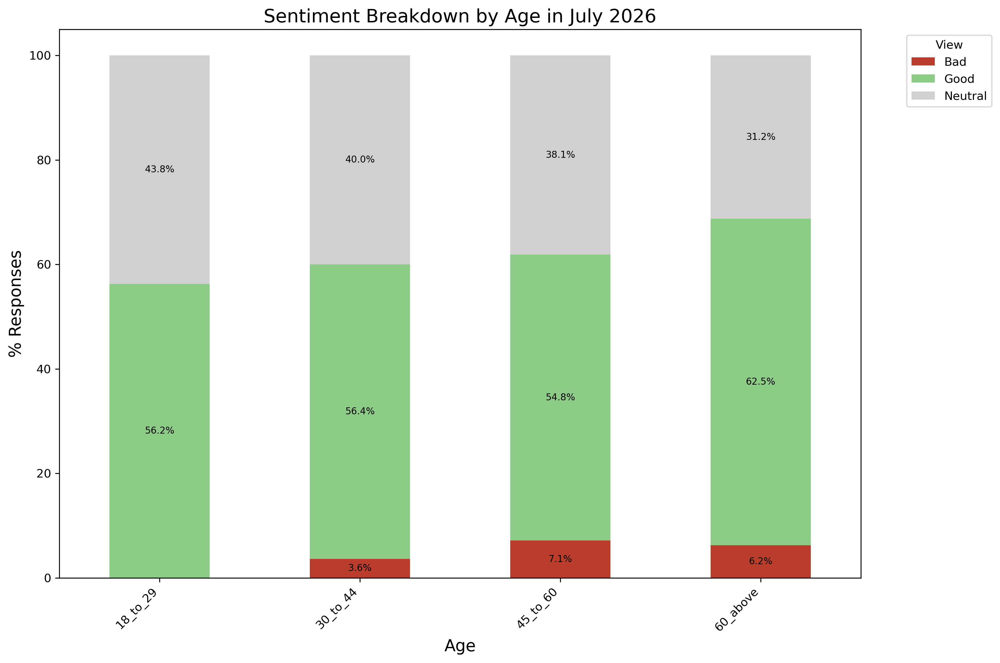

In [40]:
plot_stacked_bar_chart(july26,
                       title='Sentiment Breakdown by Age in July 2026',
                       xlabel='Age',
                       ylabel='% Responses',
                       cat_col='Age',
                       sent_col='How do you feel about Muslim people in America?')

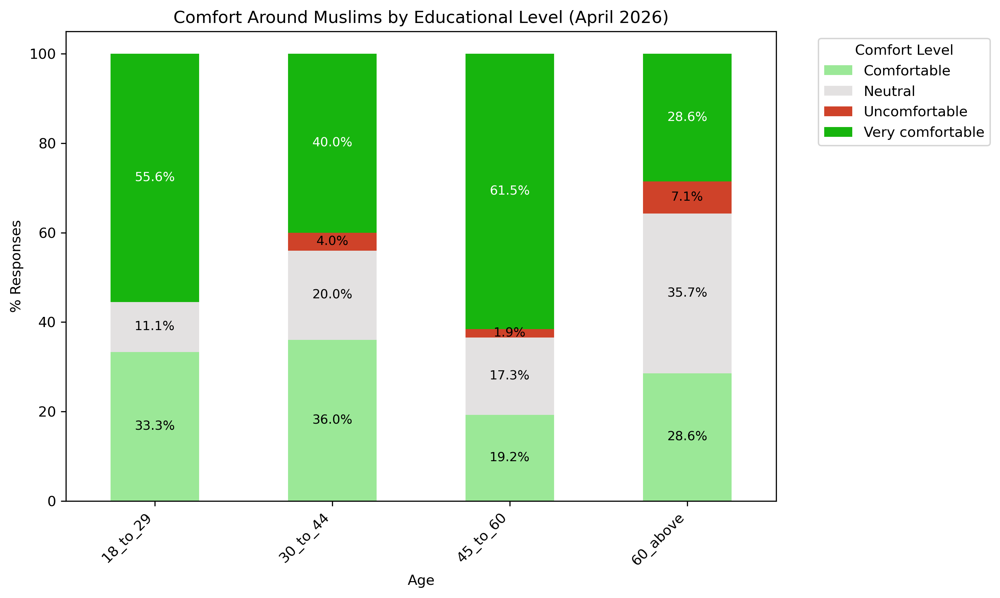

In [26]:
plot_comfort(july26,
             category_col= 'Age',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Educational Level (April 2026)',
             xlabel='Age',
             ylabel='% Responses')

# Income Vs. Sentiment

In [27]:
income_mapping = {"25000_to_49999": "25k-49k",
"50000_to_74999":"50k-74k",
"75000_to_99999": "75k-99k",
"125000_to_149999": "125k-149k",
"100000_to_124999" :"100k-124k",
"0_to_9999"        : "0-9k",
"no_answer":    "undisclosed",
"150000_to_174999":"150k-174k",
"10000_to_24999" : "10k-24k",
"200000_and_up":   "200k_up",
"175000_to_199999": "175k-199k"}

apr26['Household Income']= apr26['Household Income'].replace(income_mapping)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Distribution_is_Weighted_Toward_Middle-to-Upper_Income_Households_April_2026.png


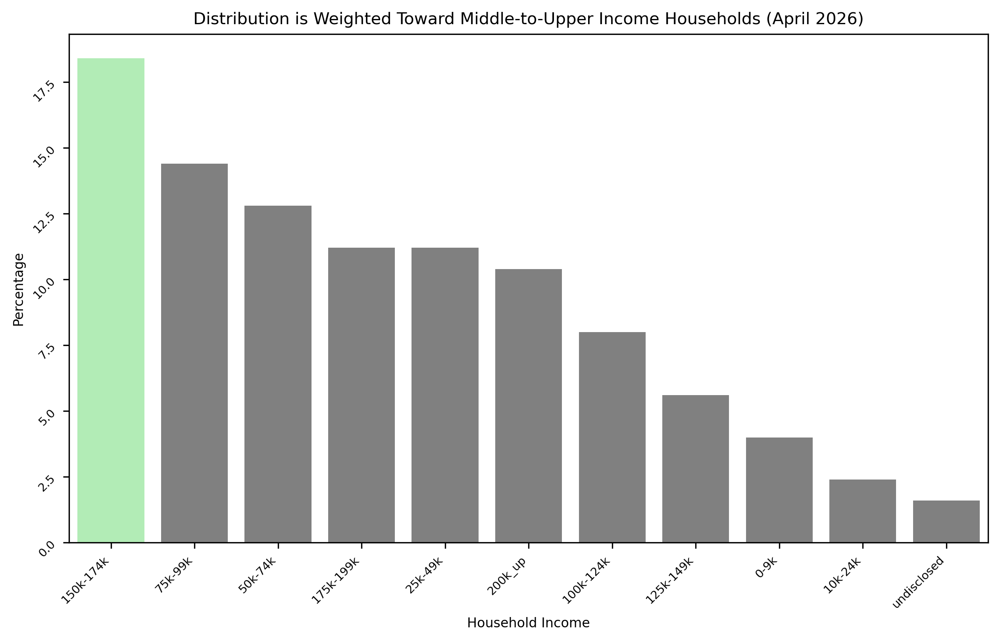

In [30]:
plot_percentages(apr26,'Household Income', 'Household Income',
           'Distribution is Weighted Toward Middle-to-Upper Income Households (April 2026)')

In [31]:
income_brackets = { "25k-49k":'low',
"50k-74k":"mid",
"75k-99k":"mid",
"125k-149k":"mid",
"100k-124k":"mid",
 "0-9k":"low",
"undisclosed":"undisclosed",
"150k-174k":"high",
"10k-24k":"low",
 "200k_up":"high",
"175k-199k":"high"}

In [32]:
apr26['Household_Income'] = apr26['Household Income'].replace(income_brackets)

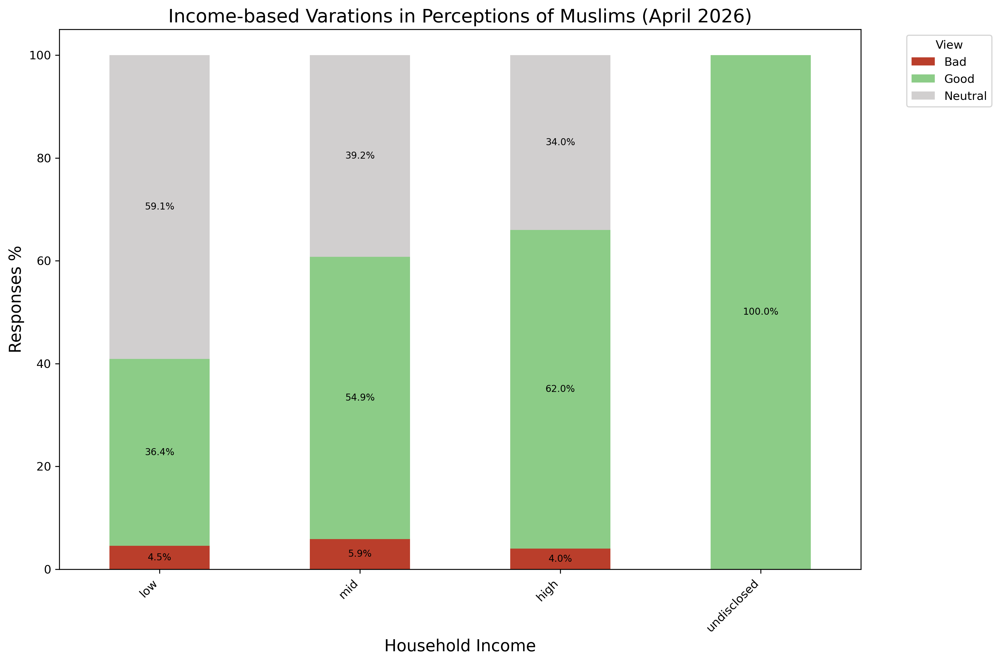

In [33]:
order = ['low','mid','high', 'undisclosed']

plot_income(
    df=apr26, 
    title='Income-based Varations in Perceptions of Muslims (April 2026)',
    xlabel='Household Income',
    ylabel='Responses %',
    cat_col='Household_Income',
    sent_col='How do you feel about Muslim people in America?',
    cat_order=order
)

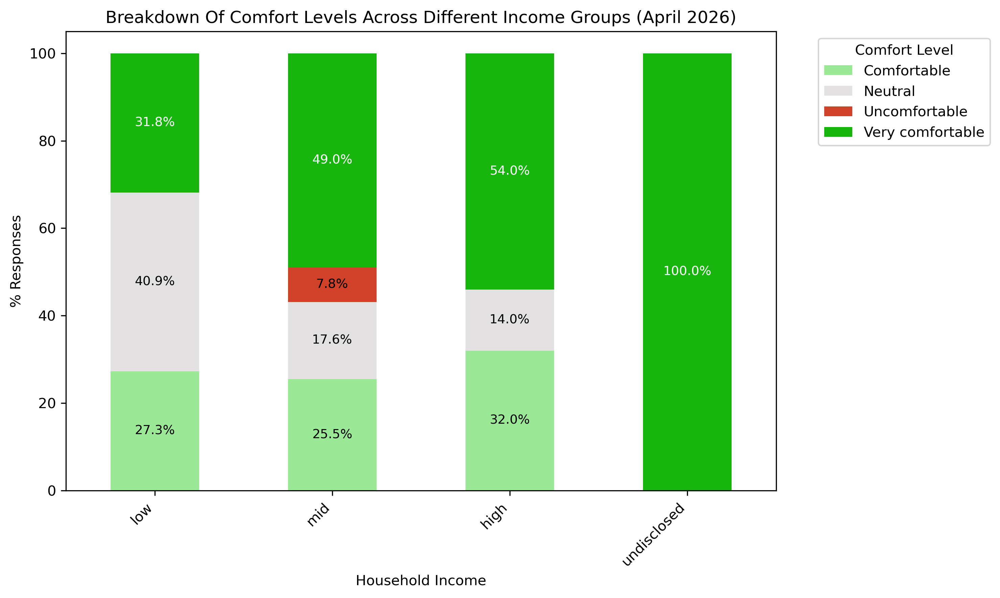

In [34]:
plot_comfort(
    df= apr26, 
    category_col= 'Household_Income',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different Income Groups (April 2026)',
    xlabel='Household Income',
    ylabel='% Responses',
)

# Region Vs Sentiment and Comfort

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Strong_Regional_Imbalance_-_Pacific_and_South_Atlantic_Account_For_~_65%.png


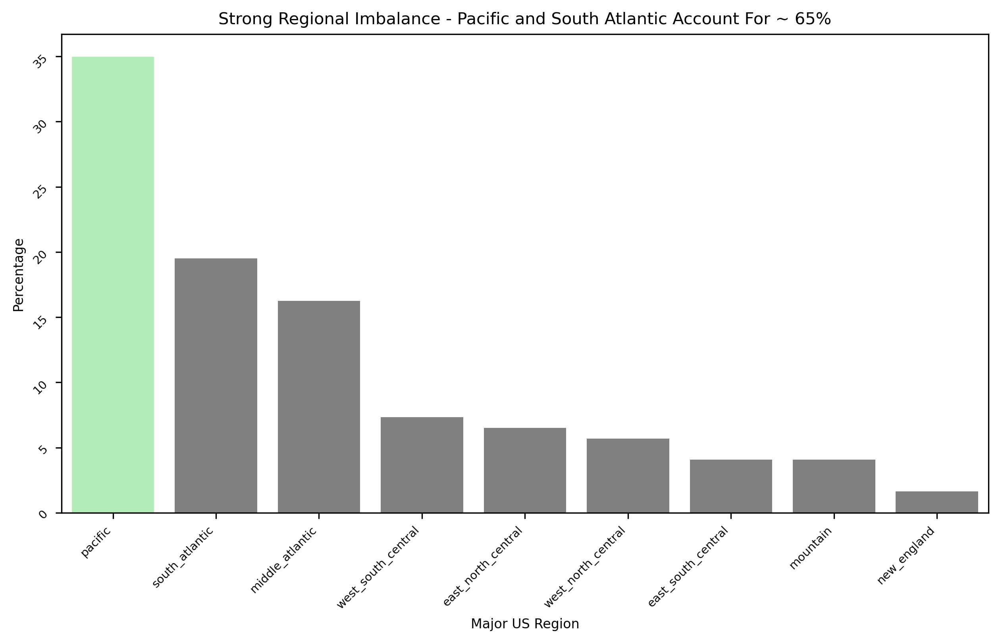

In [36]:
plot_percentages(apr26,'Major US Region', 'Major US Region',
                 'Strong Regional Imbalance - Pacific and South Atlantic Account For ~ 65%')

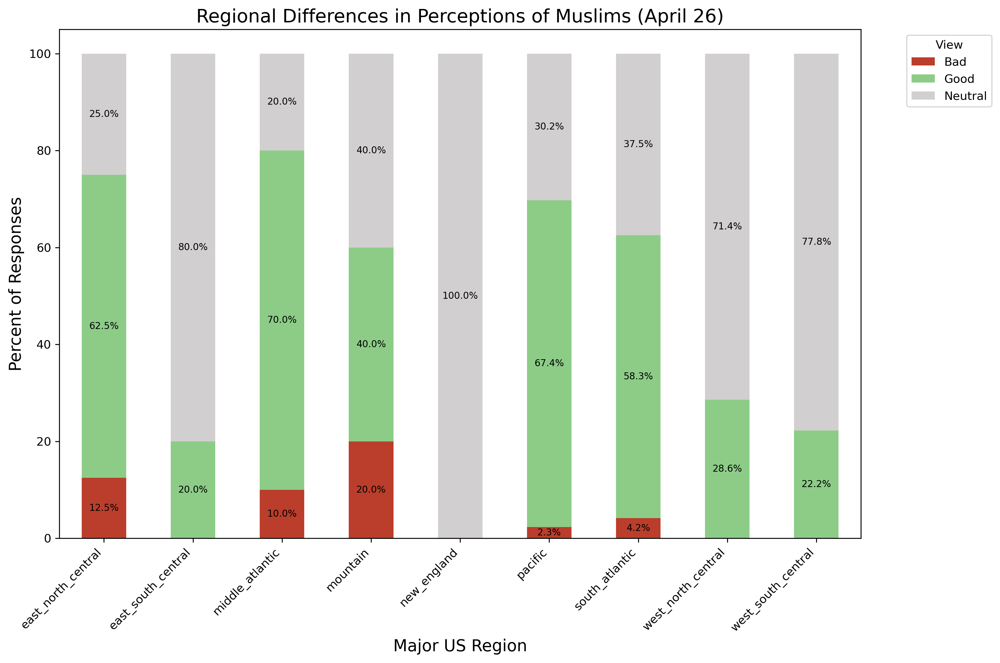

In [37]:
plot_stacked_bar_chart(
    df=apr26, 
    title='Regional Differences in Perceptions of Muslims (April 26)',
    xlabel='Major US Region',
    ylabel='Percent of Responses',
    cat_col='Major US Region',
    sent_col='How do you feel about Muslim people in America?'
)

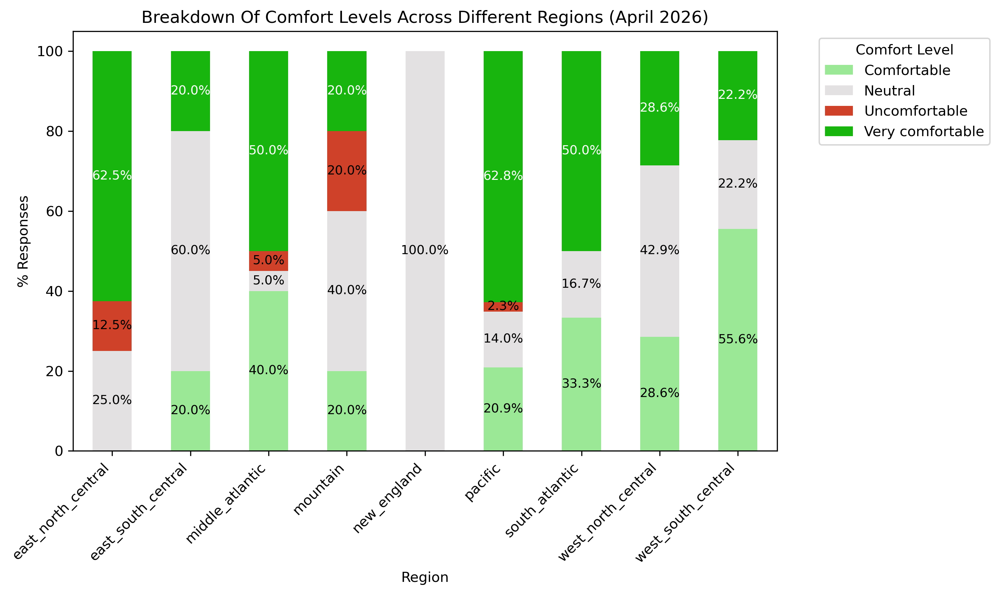

In [38]:
plot_comfort(
    df= apr26, 
    category_col= 'Major US Region',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different Regions (April 2026)',
    xlabel='Region',
    ylabel='% Responses',
)

# Relationship Between Knowing a Muslim and Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Close_to_35%_Of_Respondents_Have_Not_Spoken_to_Any_Muslims_In_The_Last_7_Days_April_26.png


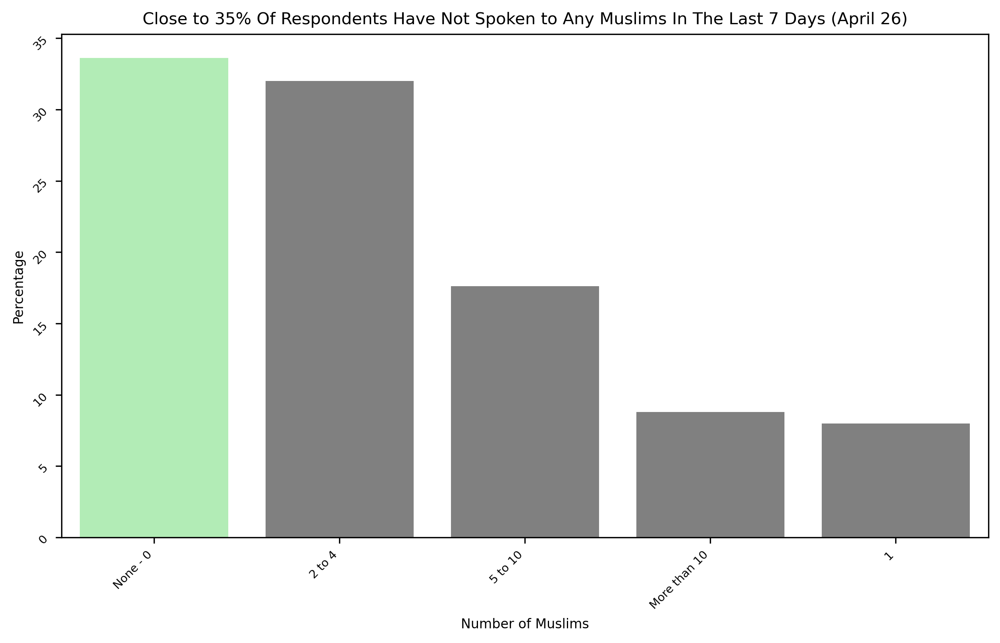

In [40]:
plot_percentages(apr26,'How many Muslim people have you talked to in the last 7 days?', 'Number of Muslims',\
           'Close to 35% Of Respondents Have Not Spoken to Any Muslims In The Last 7 Days (April 26)')

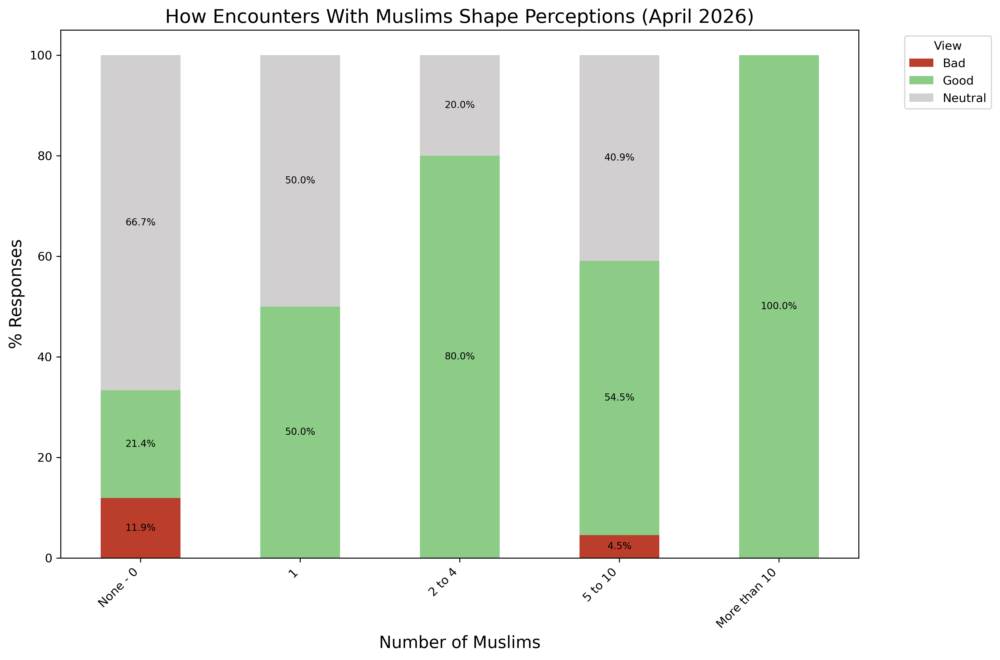

<Figure size 7200x4000 with 0 Axes>

In [41]:
plot_stacked_bar_chart_interaction(
    df=apr26, 
    title='How Encounters With Muslims Shape Perceptions (April 2026)',
    xlabel='Number of Muslims',
    ylabel='% Responses',
    cat_col='How many Muslim people have you talked to in the last 7 days?',
    sent_col='How do you feel about Muslim people in America?'
)

In [42]:
apr26_non_muslim = apr26[apr26['What is your religion?'] != 'Muslim']

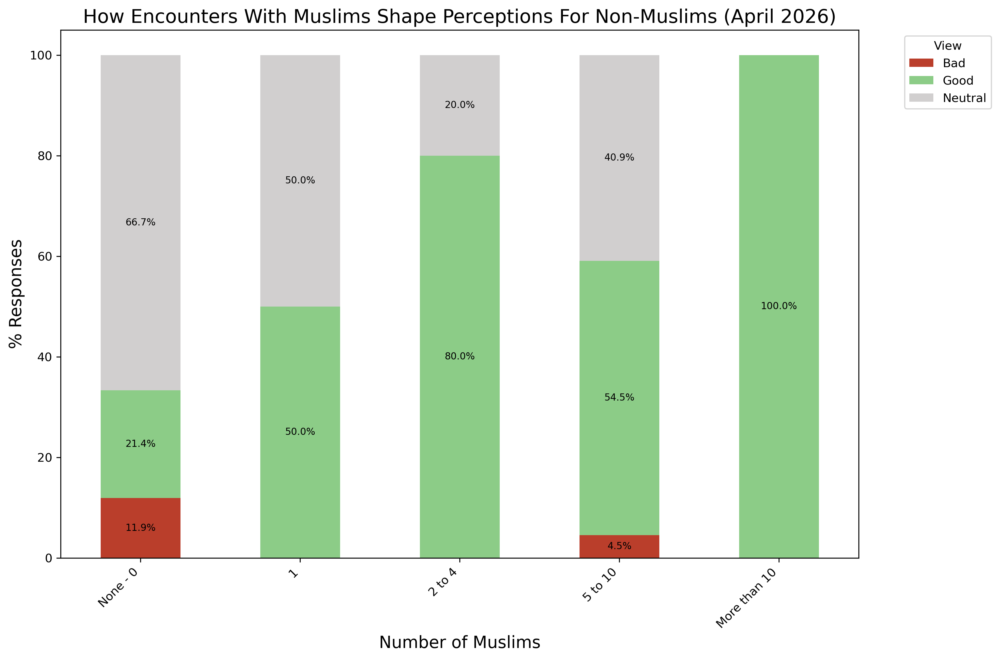

<Figure size 7200x4000 with 0 Axes>

In [43]:
plot_stacked_bar_chart_interaction(
    df=apr26_non_muslim, 
    title='How Encounters With Muslims Shape Perceptions For Non-Muslims (April 2026)',
    xlabel='Number of Muslims',
    ylabel='% Responses',
    cat_col='How many Muslim people have you talked to in the last 7 days?',
    sent_col='How do you feel about Muslim people in America?'
)

<Axes: xlabel='How many Muslim people have you talked to in the last 7 days?'>

Text(0.5, 1.0, "Number of Interactions With Muslims in The Last 7 Days by Respondent's Religion (April 2026)")

Text(0.5, 0, 'Number of Muslim People Talked To')

Text(0, 0.5, 'Percentage of Respondents')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '1'),
  Text(1, 0, '2 to 4'),
  Text(2, 0, '5 to 10'),
  Text(3, 0, 'More than 10'),
  Text(4, 0, 'None - 0')])

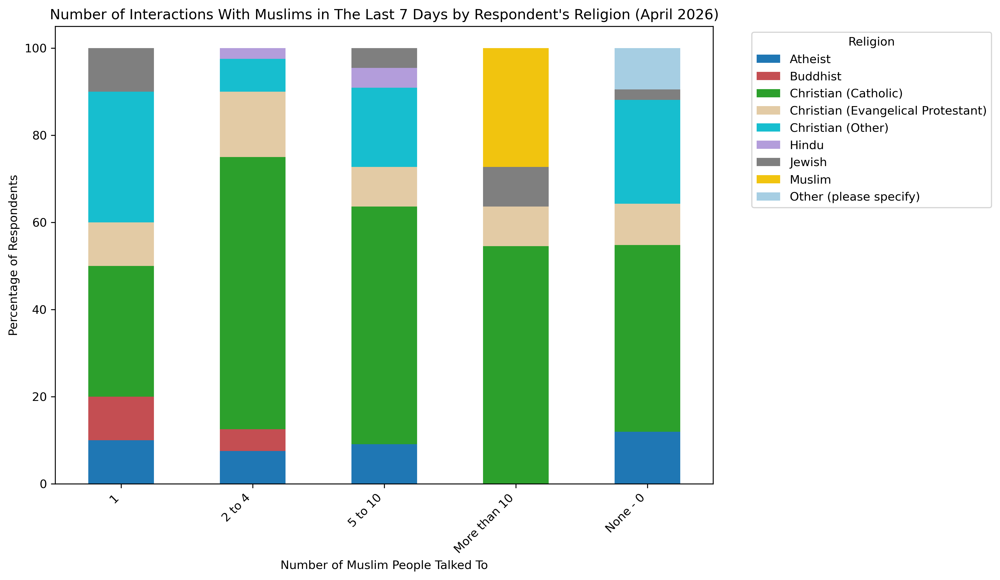

In [44]:
import matplotlib.pyplot as plt

counts = apr26.groupby(['How many Muslim people have you talked to in the last 7 days?', 
                        'What is your religion?']).size().unstack()

# Convert counts to percentages
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

# Plotting
percentages.plot(kind='bar', stacked=True, figsize=(10, 7), \
                 color = ['#1f77b4', '#c44e52', '#2ca02c', '#e3cba5', '#17becf',
          '#b39ddb', '#7f7f7f', '#f1c40f', '#a6cee3', '#e7969c']

)

plt.title("Number of Interactions With Muslims in The Last 7 Days by Respondent's Religion (April 2026)")
plt.xlabel("Number of Muslim People Talked To")
plt.ylabel("Percentage of Respondents")
plt.xticks(rotation=45, ha='right') 

plt.legend(title="Religion", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<Axes: xlabel='How many Muslim people have you talked to in the last 7 days?'>

Text(0.5, 1.0, "Number of Interactions With Muslims in The Last 7 Days by Respondent's Age (April 2026)")

Text(0.5, 0, 'Number of Muslim People Talked To')

Text(0, 0.5, 'Percentage of Respondents')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '1'),
  Text(1, 0, '2 to 4'),
  Text(2, 0, '5 to 10'),
  Text(3, 0, 'More than 10'),
  Text(4, 0, 'None - 0')])

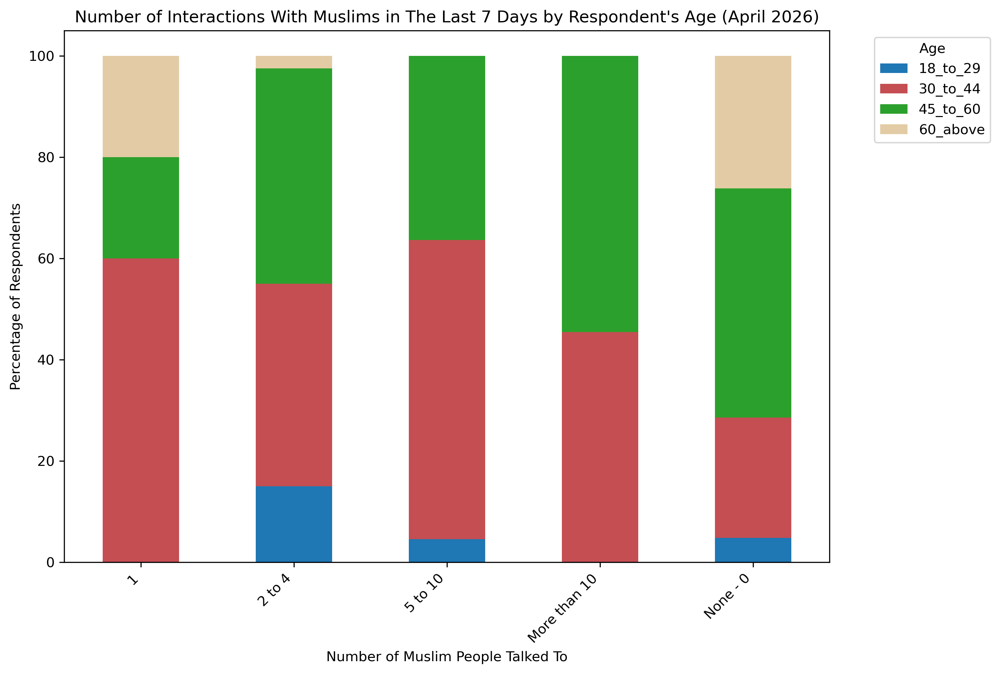

In [45]:
counts = apr26.groupby(['How many Muslim people have you talked to in the last 7 days?', 
                        'Age']).size().unstack()

# Convert counts to percentages
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

# Plotting
percentages.plot(kind='bar', stacked=True, figsize=(10, 7), \
                 color = ['#1f77b4', '#c44e52', '#2ca02c', '#e3cba5', '#17becf',
          '#b39ddb', '#7f7f7f', '#f1c40f', '#a6cee3', '#e7969c']

)

plt.title("Number of Interactions With Muslims in The Last 7 Days by Respondent's Age (April 2026)")
plt.xlabel("Number of Muslim People Talked To")
plt.ylabel("Percentage of Respondents")
plt.xticks(rotation=45, ha='right') 

plt.legend(title="Age", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# News Source Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/News_Source_Distribution_April_2026.png


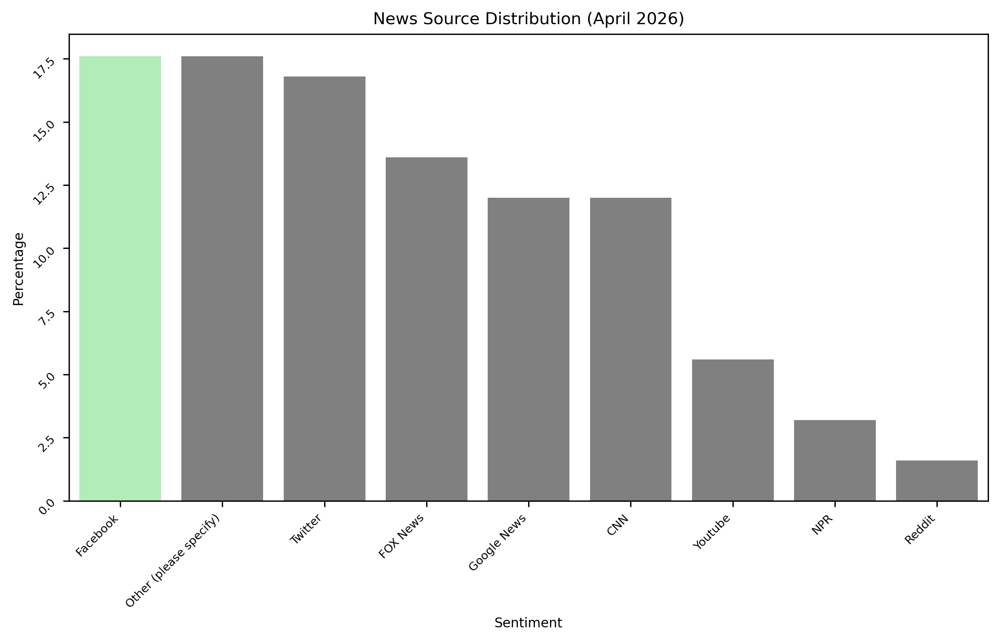

In [46]:
plot_percentages(apr26,
                 column_name='Where do you get your news from?',
                 x_label='Sentiment',
                 title='News Source Distribution (April 2026)')

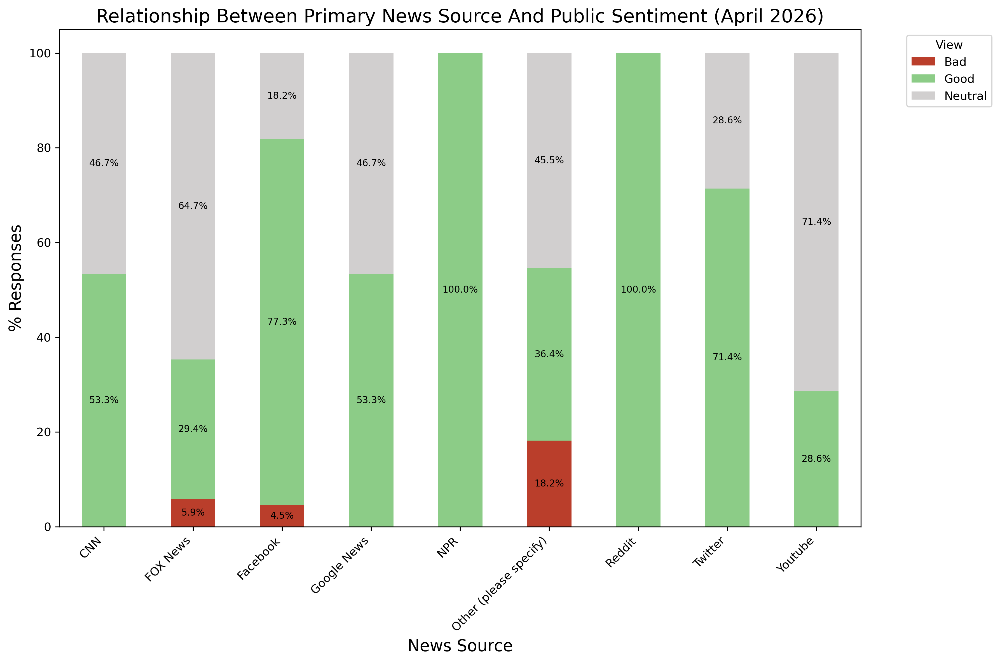

In [47]:
plot_stacked_bar_chart(
    df=apr26, 
    title='Relationship Between Primary News Source And Public Sentiment (April 2026)',
    xlabel='News Source',
    ylabel='% Responses',
    cat_col= 'Where do you get your news from?',
    sent_col='How do you feel about Muslim people in America?'
)

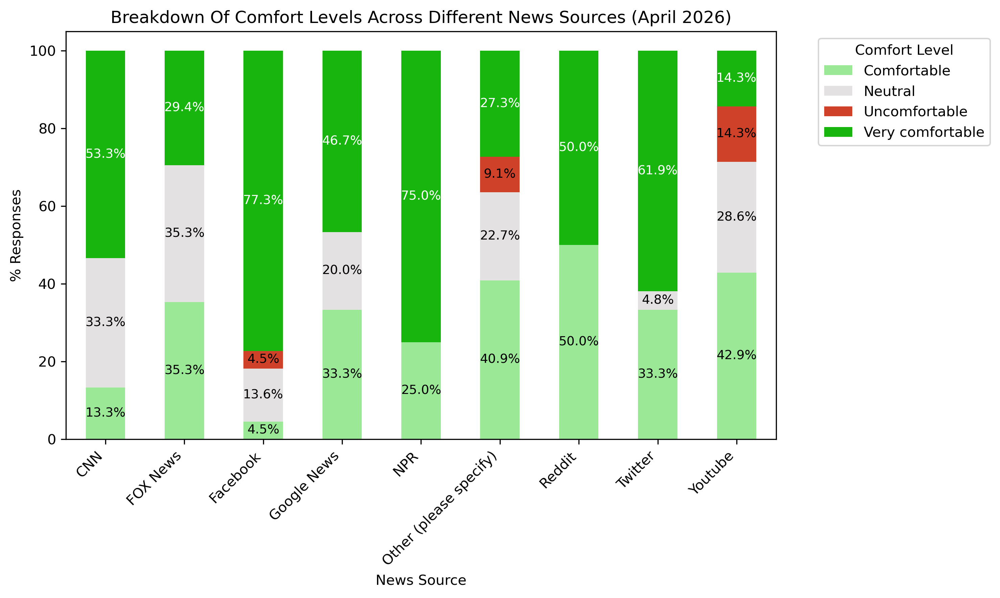

In [49]:
plot_comfort(
    df= apr26, 
    category_col= 'Where do you get your news from?',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different News Sources (April 2026)',
    xlabel='News Source',
    ylabel='% Responses',
)

## Relationship Between Exposure to Positive Portrayal and Overall Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Less_than_35%_Of_Respondents_Reported_Seeing_Positive_Stories_About_Muslims_in_the_Media_April_2026.png


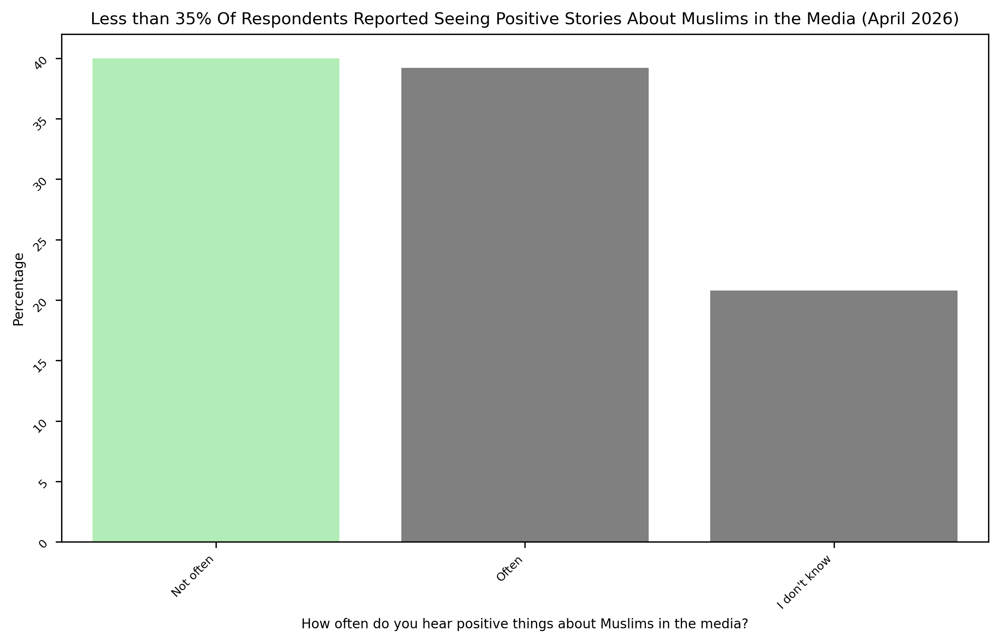

In [50]:
plot_percentages(apr26,'How often do you hear positive things about Muslims in the media?', 'How often do you hear positive things about Muslims in the media?',
           'Less than 35% Of Respondents Reported Seeing Positive Stories About Muslims in the Media (April 2026)')

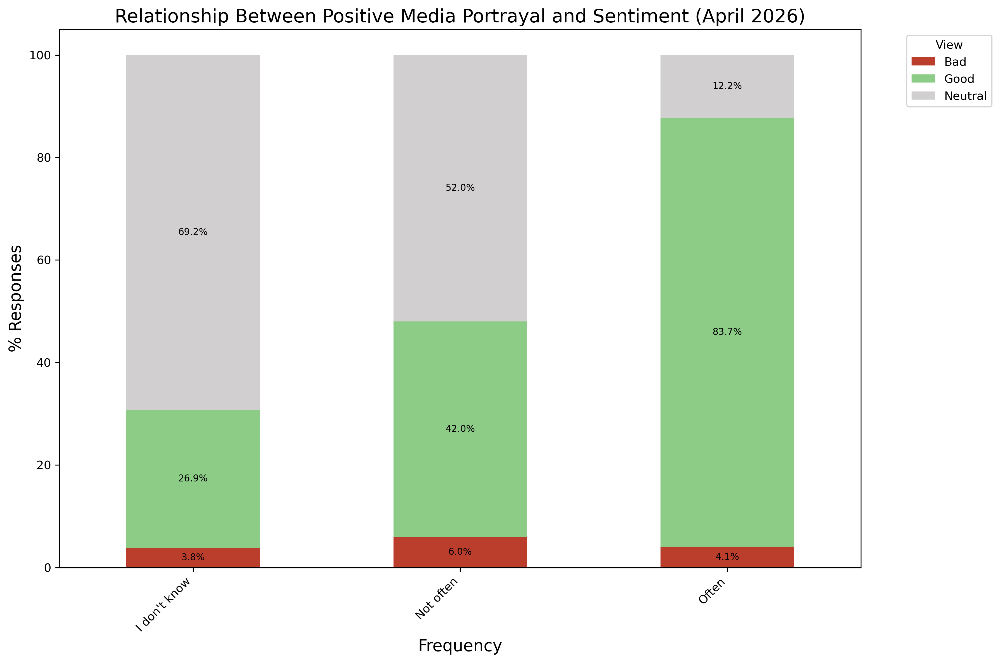

In [51]:
plot_stacked_bar_chart(
    df=apr26, 
    title='Relationship Between Positive Media Portrayal and Sentiment (April 2026)',
    xlabel='Frequency',
    ylabel='% Responses',
    cat_col= 'How often do you hear positive things about Muslims in the media?',
    sent_col='How do you feel about Muslim people in America?'
)

In [52]:
pd.crosstab(
    apr26['Where do you get your news from?'],
    apr26['How often do you hear positive things about Muslims in the media?']
)

How often do you hear positive things about Muslims in the media?,I don't know,Not often,Often
Where do you get your news from?,,,
CNN,1,7,7
FOX News,5,7,5
Facebook,1,4,17
Google News,4,7,4
NPR,1,3,0
Other (please specify),9,11,2
Reddit,1,0,1
Twitter,2,7,12
Youtube,2,4,1


In [53]:
apr26[apr26['Where do you get your news from?']=='Other (please specify)']

,Start Date,End Date,What is your religion?,Religion_other,How many Muslim people have you talked to in the last 7 days?,How do you feel about Muslim people in America?,What is your level of education?,Where do you get your news from?,News_other,How comfortable do you feel interacting with Muslims in your community?,...,"How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",Do you feel you have a lot in common with Muslims in America?,"If you had questions about Islam or Muslims, where would you go to learn more?",Have you ever changed your opinion about a group of people after getting to know someone personally,Have you ever been helped by a Muslim?,Gender,Age,Major US Region,Household Income,Household_Income
24,04/15/2026 09:52:06 PM,04/15/2026 09:54:11 PM,Other (please specify),NaN,None - 0,Neutral,College,Other (please specify),I don't get news at all.,Neutral,...,None at all,Not sure,I wouldn't seek info,Not sure,No,female,45_to_60,west_north_central,50k-74k,mid
38,04/15/2026 06:15:31 PM,04/15/2026 06:17:51 PM,Other (please specify),wiccan,None - 0,Neutral,College,Other (please specify),local,Comfortable,...,A moderate amount,No,Friends,No,No,male,45_to_60,pacific,25k-49k,low
41,04/15/2026 05:28:13 PM,04/15/2026 05:31:41 PM,Christian (Catholic),NaN,None - 0,Bad,College,Other (please specify),"Newsmax , C-Span , Epic News and assorted on l...",Uncomfortable,...,A moderate amount,No,Internet,Not sure,No,male,60_above,middle_atlantic,50k-74k,mid
42,04/15/2026 05:21:20 PM,04/15/2026 05:23:38 PM,Christian (Evangelical Protestant),NaN,None - 0,Neutral,High school or less,Other (please specify),ABC news,Neutral,...,None at all,Not sure,Internet,Not sure,No,female,60_above,west_south_central,50k-74k,mid
52,04/15/2026 03:23:12 PM,04/15/2026 03:26:05 PM,Atheist,NaN,1,Good,Some College,Other (please specify),pbs,Very comfortable,...,A little,Yes,I wouldn't seek info,Yes,Yes,female,30_to_44,south_atlantic,10k-24k,low
56,04/15/2026 03:14:37 PM,04/15/2026 03:16:30 PM,Christian (Catholic),NaN,None - 0,Neutral,Some College,Other (please specify),Several different ways,Comfortable,...,A little,No,Internet,Not sure,No,male,45_to_60,east_south_central,125k-149k,mid
57,04/15/2026 03:14:54 PM,04/15/2026 03:16:27 PM,Christian (Catholic),NaN,None - 0,Neutral,College,Other (please specify),local news,Neutral,...,None at all,Not sure,Internet,Yes,No,female,30_to_44,west_north_central,50k-74k,mid
58,04/15/2026 03:09:34 PM,04/15/2026 03:11:14 PM,Buddhist,NaN,1,Good,Some College,Other (please specify),MSNBC,Comfortable,...,A moderate amount,Not sure,Religious Leaders,No,Yes,female,30_to_44,south_atlantic,50k-74k,mid
59,04/15/2026 03:03:13 PM,04/15/2026 03:06:16 PM,Jewish,NaN,None - 0,Neutral,High school or less,Other (please specify),nbc,Very comfortable,...,A great deal,Not sure,Internet,Yes,No,female,60_above,pacific,25k-49k,low
60,04/15/2026 03:02:40 PM,04/15/2026 03:04:16 PM,Christian (Catholic),NaN,None - 0,Good,Some College,Other (please specify),kyvu,Very comfortable,...,None at all,Not sure,Friends,Yes,No,female,45_to_60,pacific,50k-74k,mid


## Relationship Between Gender and Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Close_to_55%_of_the_Survey_Participants_Were_Women_April_2026.png


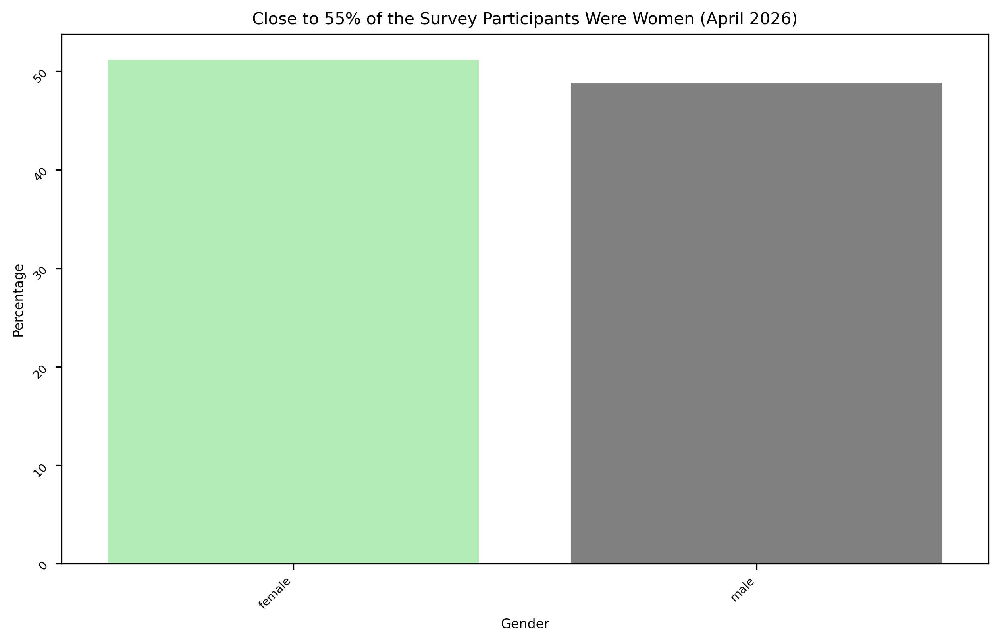

In [55]:
plot_percentages(apr26,'Gender', 'Gender',
           'Close to 55% of the Survey Participants Were Women (April 2026)')

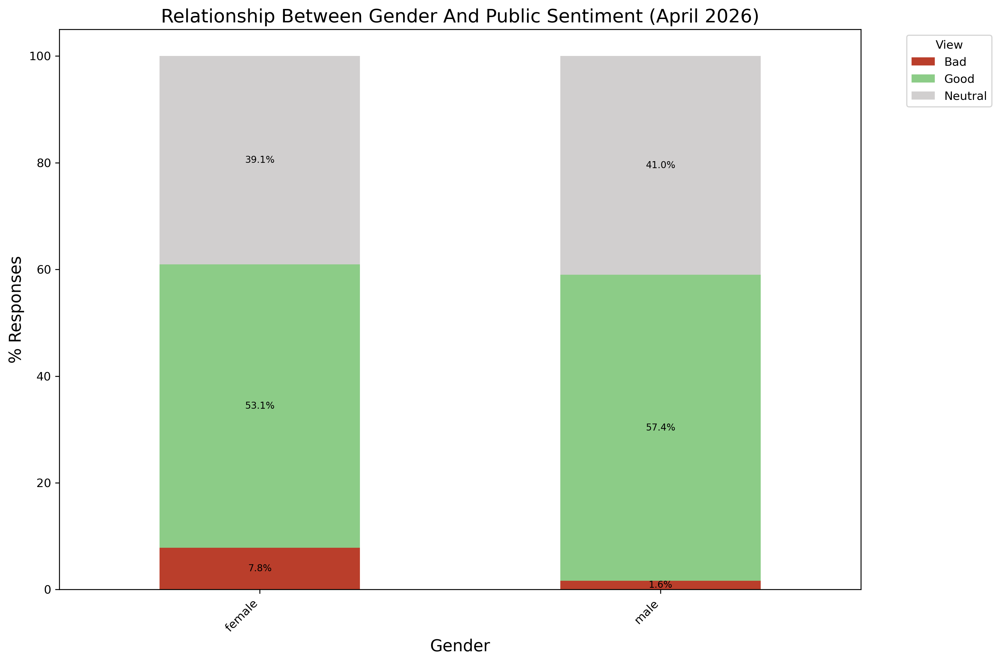

In [56]:
plot_stacked_bar_chart(
    df=apr26, 
    title='Relationship Between Gender And Public Sentiment (April 2026)',
    xlabel='Gender',
    ylabel='% Responses',
    cat_col= 'Gender',
    sent_col='How do you feel about Muslim people in America?'
)

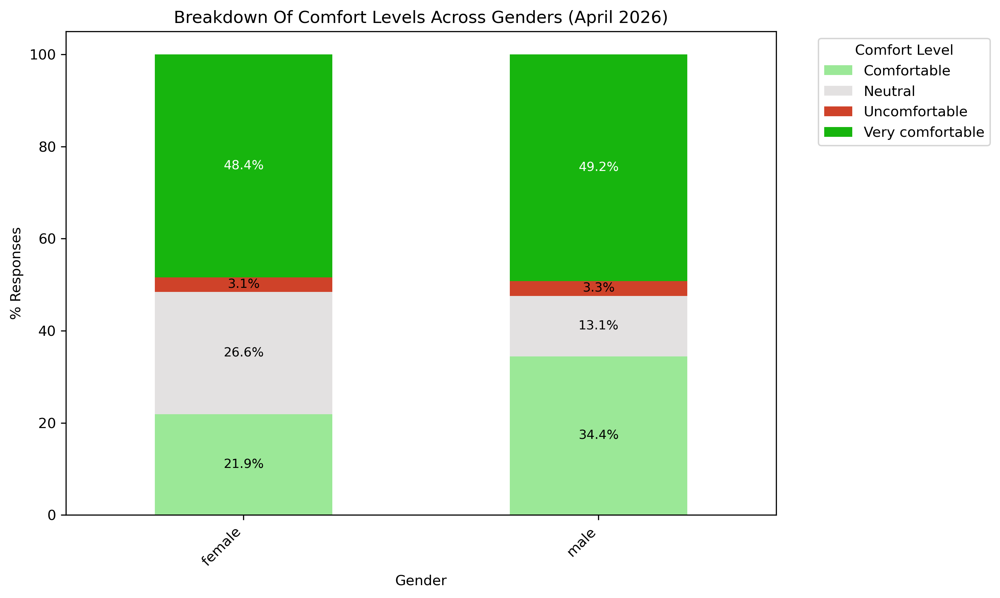

In [57]:
plot_comfort(
    df= apr26, 
    category_col= 'Gender',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Genders (April 2026)',
    xlabel='Gender',
    ylabel='% Responses',
)

## Educational Level Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/~45%_of_the_Survey_Participants_Went_to_Graduate_School_April_2026.png


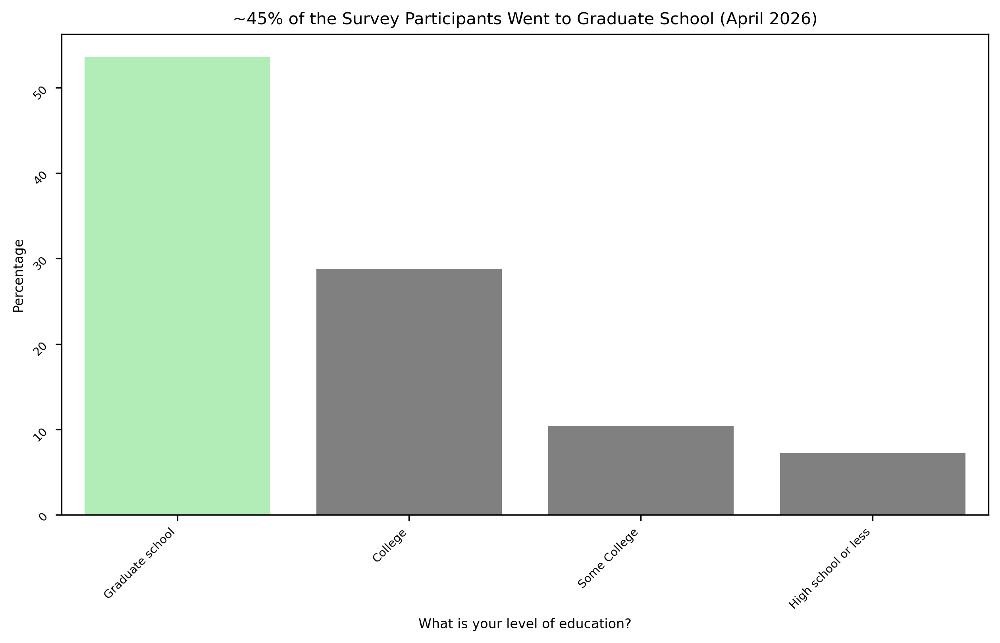

In [58]:
plot_percentages(apr26,'What is your level of education?', 'What is your level of education?',
           '~45% of the Survey Participants Went to Graduate School (April 2026)')

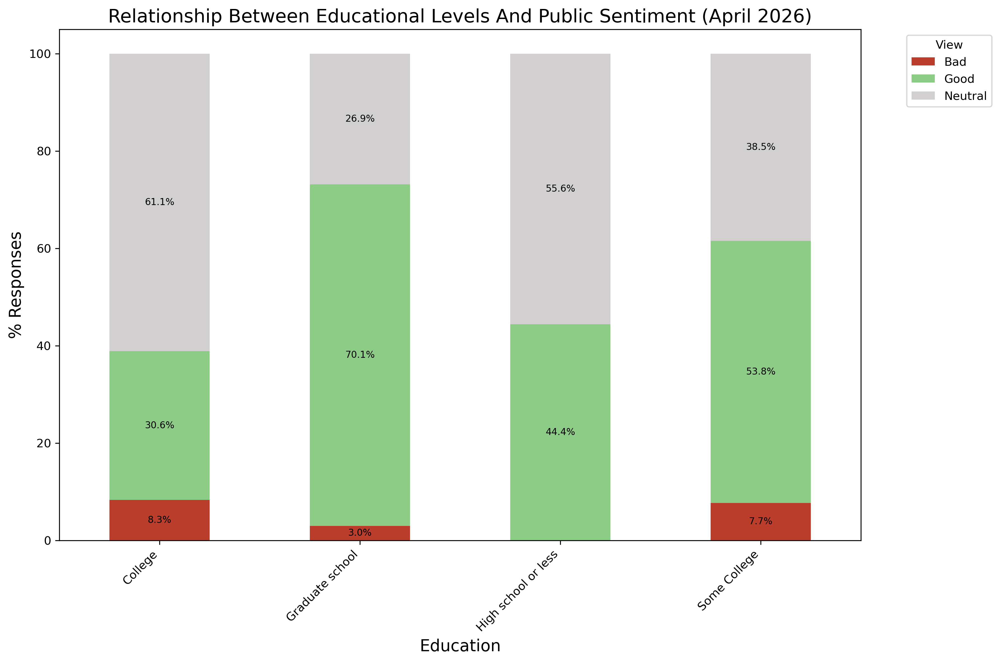

In [59]:
plot_stacked_bar_chart(
    df=apr26, 
    title='Relationship Between Educational Levels And Public Sentiment (April 2026)',
    xlabel='Education',
    ylabel='% Responses',
    cat_col= 'What is your level of education?',
    sent_col='How do you feel about Muslim people in America?'
)

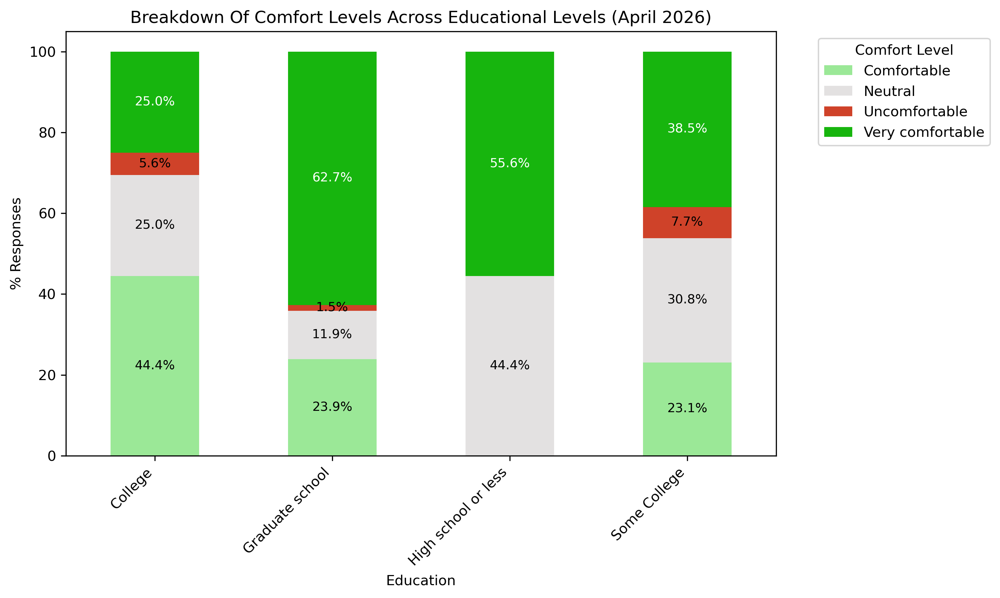

In [61]:
plot_comfort(
    df= apr26, 
    category_col= 'What is your level of education?',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Educational Levels (April 2026)',
    xlabel='Education',
    ylabel='% Responses',
)

## Relationship Between Event Exposure and Overall Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Exposure_to_Muslim-Sponsored_Events:_Distribution_April_2026.png


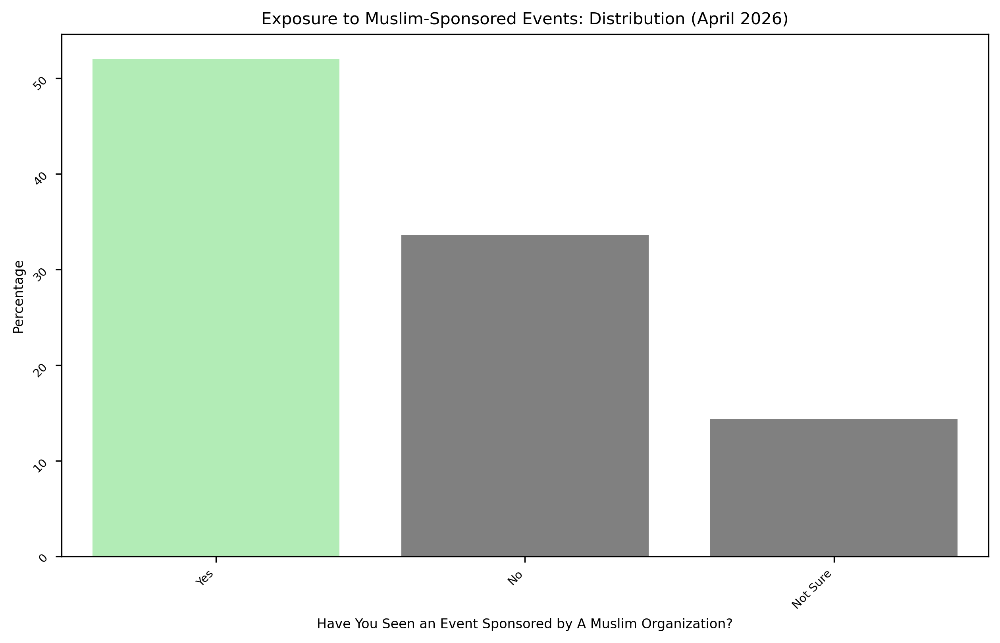

In [63]:
column_name= 'In the last 30 days, have you come across any events or activities \
sponsored by a Muslim person or organization?'
df= apr26
x_label= "Have You Seen an Event Sponsored by A Muslim Organization?"
title= "Exposure to Muslim-Sponsored Events: Distribution (April 2026)"
    
plot_percentages(df, column_name, x_label, title)

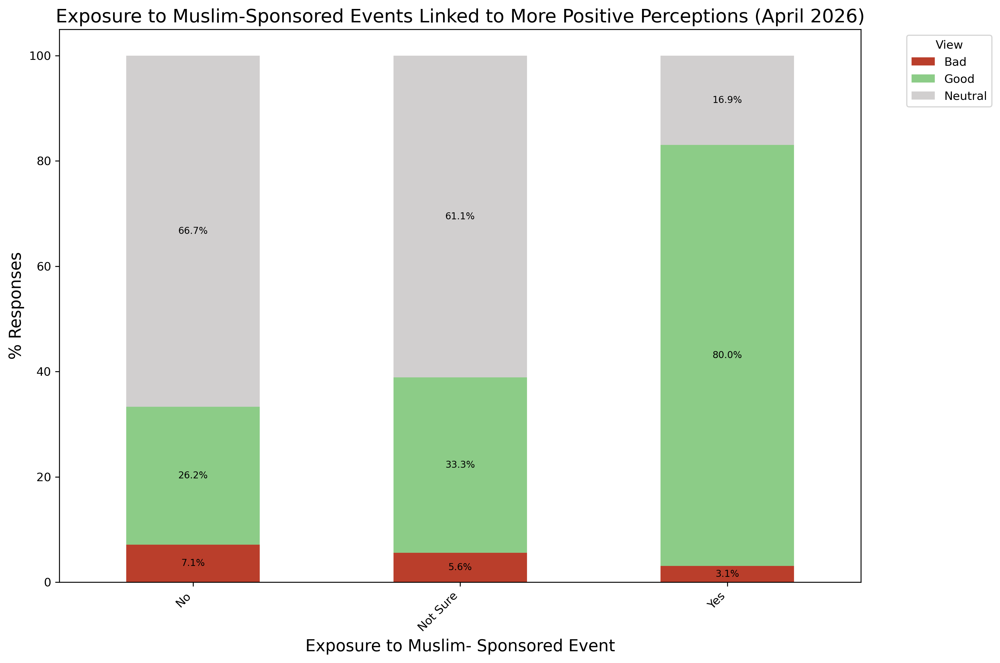

In [64]:
plot_stacked_bar_chart(
    df=apr26, 
    title="Exposure to Muslim-Sponsored Events Linked to More Positive Perceptions (April 2026)",
    xlabel='Exposure to Muslim- Sponsored Event',
    ylabel='% Responses',
    cat_col= column_name,
    sent_col='How do you feel about Muslim people in America?'
)

In [65]:
grouped = (
    apr26.groupby(['What is your religion?', column_name, 'How do you feel about Muslim people in America?'])
    .size()
    .reset_index(name='count')
)

# Normalize within each religion + exposure group to get percentages
grouped['percent'] = grouped.groupby(['What is your religion?', column_name])['count'].\
transform(lambda x: 100 * x / x.sum())

Text(0.5, 0.98, 'Perceptions of Muslims by Exposure and Religious Affiliation (April 2026)')

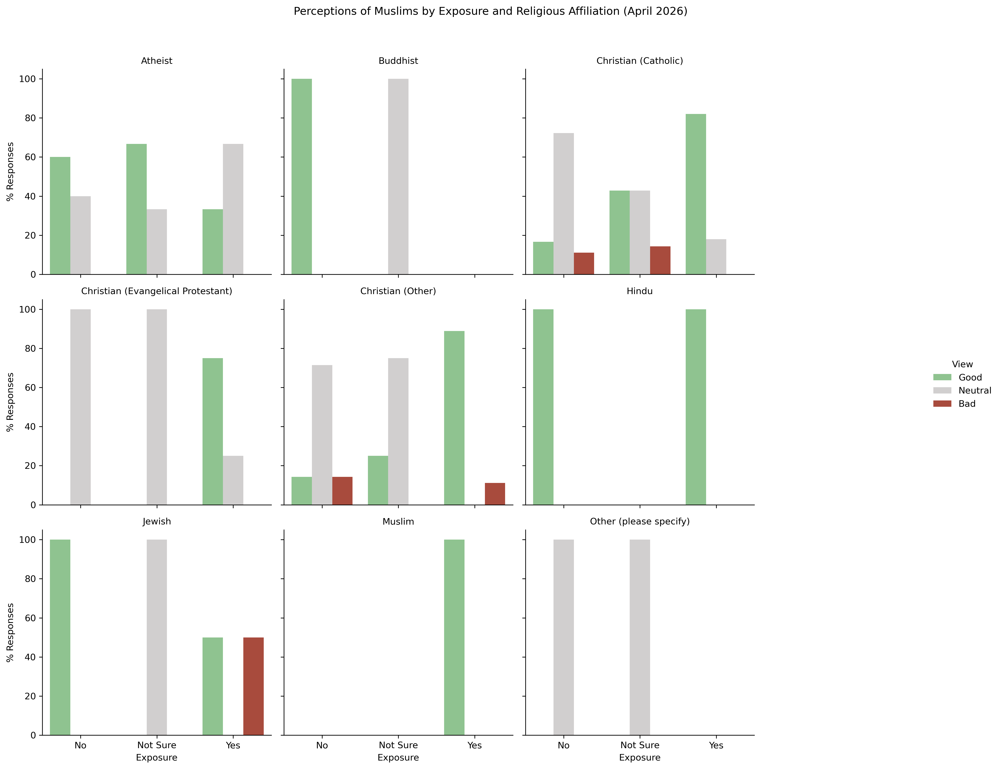

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt

g = sns.catplot(
    data=grouped,
    kind='bar',
    x=column_name,
    y='percent',
    hue='How do you feel about Muslim people in America?',
    col='What is your religion?',
    col_wrap=3,
    height=4,
    palette={'Good': '#86cc87', 'Neutral': '#d1cfcf', 'Bad': '#ba3e2b'}
)

g.set_titles("{col_name}")
g.set_axis_labels("Exposure", "% Responses")
g._legend.set_title("View")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Perceptions of Muslims by Exposure and Religious Affiliation (April 2026)")

# Level of Engagement with Muslims

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Close_to_90%_of_the_Survey_Participants_Are_Comfortable_Buying_From_Muslims_April_2026.png


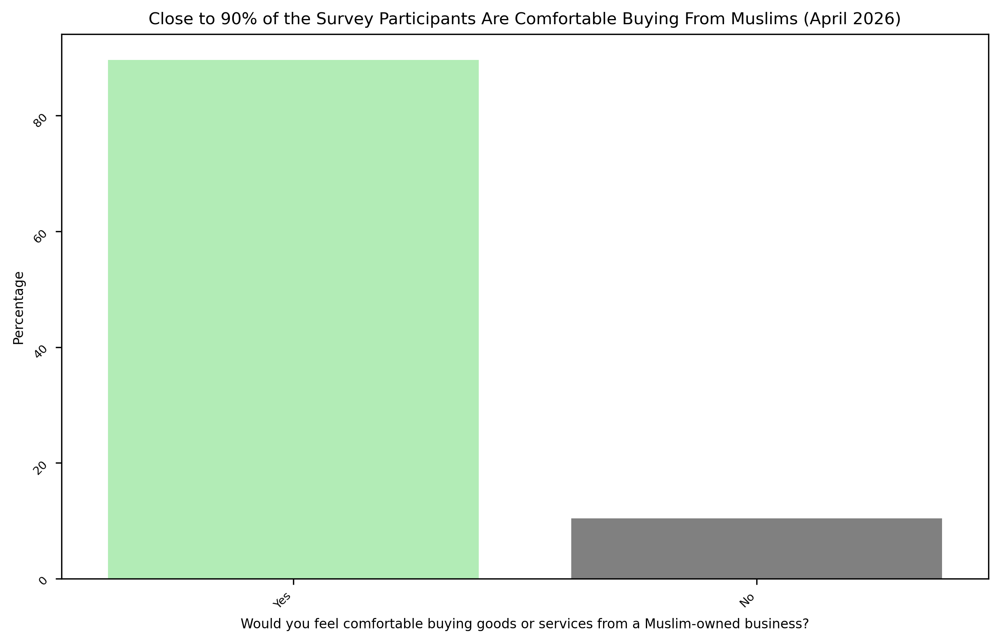

In [70]:
plot_percentages(apr26,'Would you feel comfortable buying goods or services from a Muslim-owned business?',\
                 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
           'Close to 90% of the Survey Participants Are Comfortable Buying From Muslims (April 2026)')

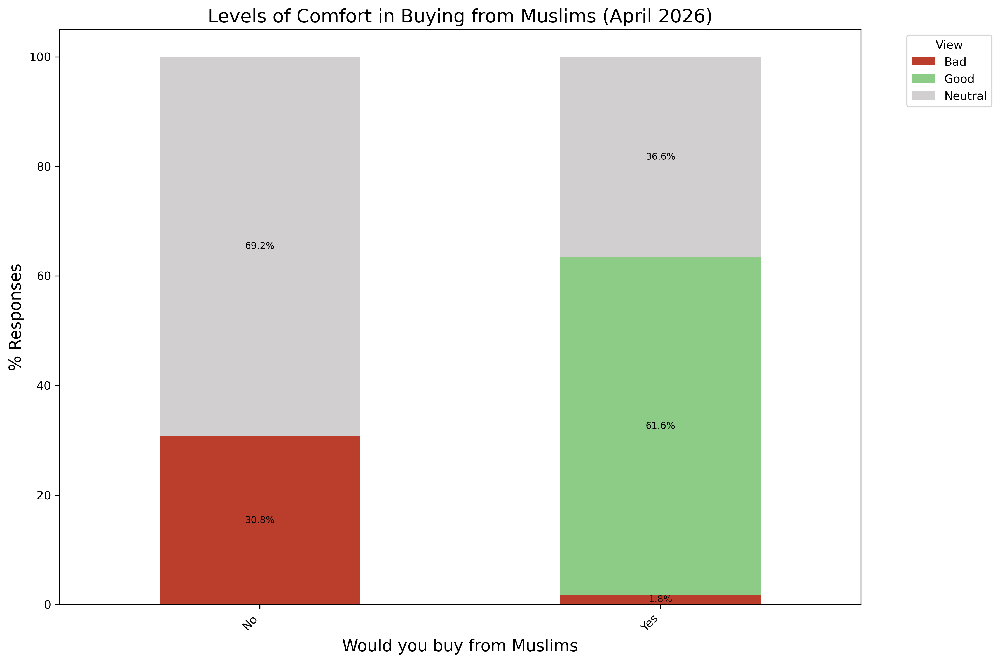

In [68]:
plot_stacked_bar_chart(
    df=apr26, 
    title="Levels of Comfort in Buying from Muslims (April 2026)",
    xlabel='Would you buy from Muslims',
    ylabel='% Responses',
    cat_col= 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
    sent_col='How do you feel about Muslim people in America?'
)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Only_45%_of_the_Survey_Participants_Are_Comfortable_Visting_A_Mosque_April_2026.png


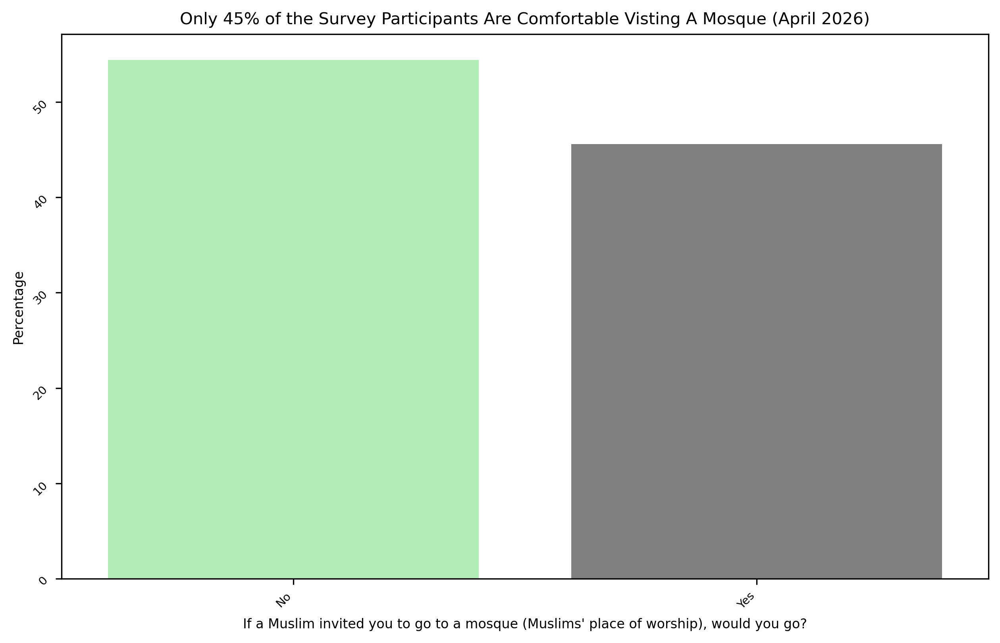

In [72]:
plot_percentages(apr26,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",\
                 "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
           "Only 45% of the Survey Participants Are Comfortable Visting A Mosque (April 2026)")

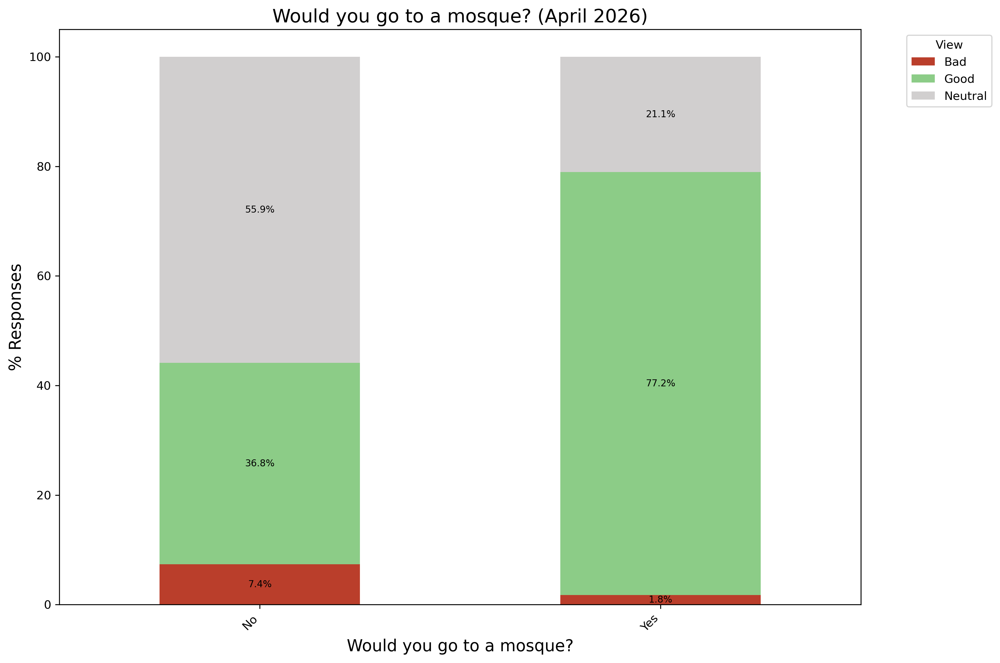

In [73]:
plot_stacked_bar_chart(
    df=apr26, 
    title="Would you go to a mosque? (April 2026)",
    xlabel='Would you go to a mosque?',
    ylabel='% Responses',
    cat_col= "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    sent_col='How do you feel about Muslim people in America?'
)

# Characteristics of Those Who Answered No

## “What religions/gender/income group...etc do the ‘No’ respondents belong to?”

In [74]:
def summarize_group(df, columns):
    """
    Returns a DataFrame summarizing the percentage distribution
    of each unique value in the selected columns.

    Parameters:
    - df: The filtered DataFrame (e.g., those who said "No" to visiting a mosque)
    - columns: List of column names to summarize

    Returns:
    - Dictionary of DataFrames for each column
    """
    summary_tables = {}
    for col in columns:
        summary = df[col].value_counts(normalize=True, dropna=False).mul(100).round(1).rename("Percentage")
        summary_tables[col] = summary.to_frame()
    return summary_tables


In [79]:
no_mosque = apr26[
    apr26["If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?"] == "No"
]

columns_to_summarize = [
    "What is your religion?",
    "Age",
    "Household_Income",
    "Major US Region",
    "Gender",
    "Where do you get your news from?",
    "How do you feel about Muslim people in America?",
    "In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?",
    "How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",
    "Do you feel you have a lot in common with Muslims in America?",
    "If you had questions about Islam or Muslims, where would you go to learn more?",
    "Have you ever changed your opinion about a group of people after getting to know someone personally"
    
]

summary_results = summarize_group(no_mosque, columns_to_summarize)


In [80]:
print("=======Religion==========")
summary_results["What is your religion?"]
print("=====Age=====")
summary_results["Age"]
print("====Gender======")
summary_results["Gender"]
print("====News======")
summary_results["Where do you get your news from?"]

=======Religion==========


,Percentage
Christian (Catholic),51.5
Christian (Other),14.7
Christian (Evangelical Protestant),13.2
Atheist,8.8
Other (please specify),4.4
Buddhist,2.9
Jewish,2.9
Muslim,1.5


=====Age=====


,Percentage
30_to_44,41.2
45_to_60,38.2
60_above,13.2
18_to_29,7.4


====Gender======


,Percentage
female,54.4
male,45.6


====News======


,Percentage
Other (please specify),19.1
CNN,16.2
Twitter,16.2
FOX News,16.2
Facebook,11.8
Google News,10.3
Youtube,8.8
NPR,1.5


## “What proportion within each religious group said they wouldn’t go to the mosque?”

To avoid misinterpretation, without normalizing by group size, large groups (like Catholics) may dominate the "No" responses just because there are more of them and not because they are more likely to say "No."

In [81]:
def normalize_by_group(df, col, mosque):
    summary = pd.crosstab(
    df[col],
    df[mosque],
    normalize='index'
).mul(100).round(1)
    return summary

In [82]:
normalize_by_group(apr26,"What is your religion?"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
What is your religion?,,
Atheist,54.5,45.5
Buddhist,66.7,33.3
Christian (Catholic),54.7,45.3
Christian (Evangelical Protestant),64.3,35.7
Christian (Other),50.0,50.0
Hindu,0.0,100.0
Jewish,50.0,50.0
Muslim,33.3,66.7
Other (please specify),75.0,25.0


In [83]:
normalize_by_group(apr26,"Age"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
Age,,
18_to_29,55.6,44.4
30_to_44,56.0,44.0
45_to_60,50.0,50.0
60_above,64.3,35.7


In [85]:
normalize_by_group(apr26,"Where do you get your news from?"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
Where do you get your news from?,,
CNN,73.3,26.7
FOX News,64.7,35.3
Facebook,36.4,63.6
Google News,46.7,53.3
NPR,25.0,75.0
Other (please specify),59.1,40.9
Reddit,0.0,100.0
Twitter,52.4,47.6
Youtube,85.7,14.3


In [86]:
normalize_by_group(apr26,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    "Have you ever changed your opinion about a group of people after getting to know someone personally")

Have you ever changed your opinion about a group of people after getting to know someone personally,No,Not sure,Yes
"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",,,
No,26.5,16.2,57.4
Yes,17.5,7.0,75.4


# Common Grounds With Muslims

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Close_to_30%_of_Survey_Participants_Feel_They_Do_Not_Have_A_Lot_In_Common_With_Muslims_April_2026.png


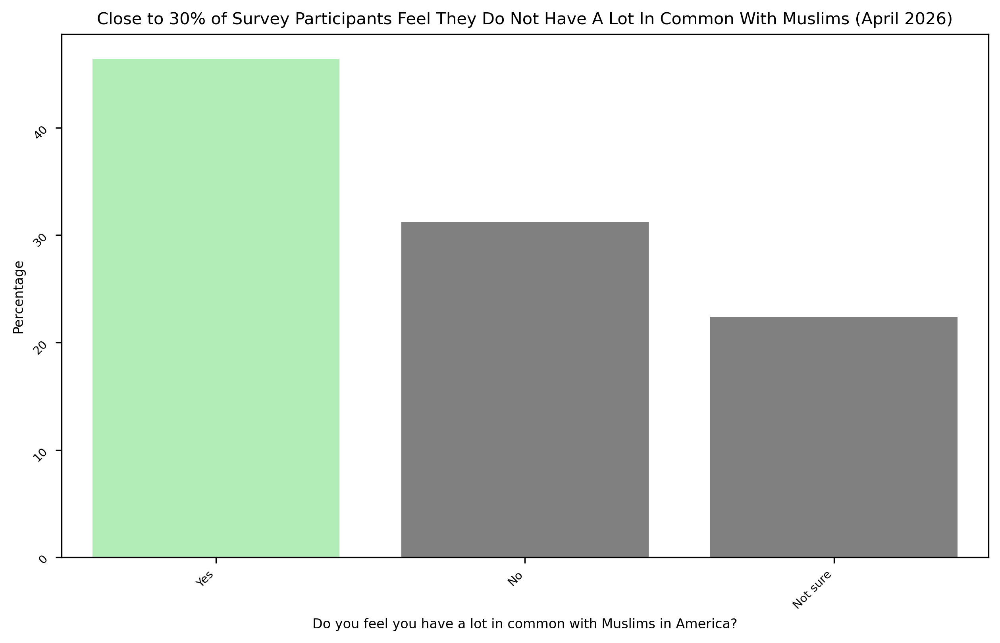

In [88]:
plot_percentages(apr26,'Do you feel you have a lot in common with Muslims in America?',\
                 'Do you feel you have a lot in common with Muslims in America?',
           'Close to 30% of Survey Participants Feel They Do Not Have A Lot In Common With Muslims (April 2026)')

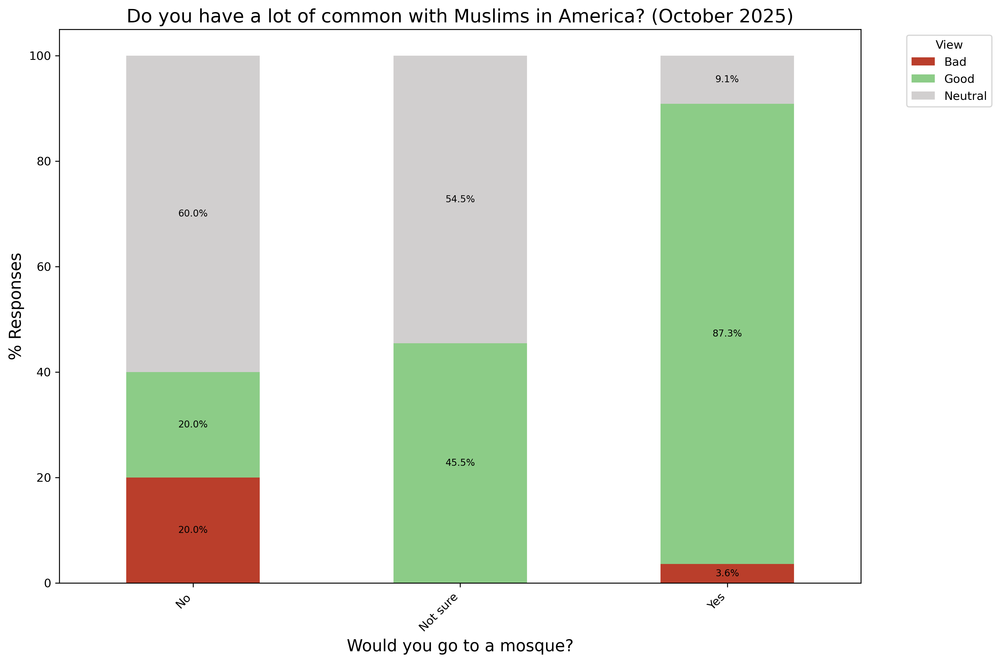

In [106]:
plot_stacked_bar_chart(
    df=oct25, 
    title="Do you have a lot of common with Muslims in America? (October 2025)",
    xlabel='Would you go to a mosque?',
    ylabel='% Responses',
    cat_col= "Do you feel you have a lot in common with Muslims in America?",
    sent_col='How do you feel about Muslim people in America?'
)